In [23]:
# # Me ayuda a convertir los archivos a formato csv
# import os
# import pandas as pd
# import chardet

# # Definir la carpeta de entrada y salida
# carpeta_datos = '/home/jupyter-user5/multicellularity_patterns_classification-/carpeta_datos/' 
# carpeta_csv = '/home/jupyter-user5/multicellularity_patterns_classification-/carpeta_datos/carpeta_csv/' 

# # Crear la carpeta de salida si no existe
# if not os.path.exists(carpeta_csv):
#     os.makedirs(carpeta_csv)

# def detectar_codificacion(ruta_archivo):
#     with open(ruta_archivo, 'rb') as file:
#         raw = file.read()
#         result = chardet.detect(raw)
#     return result['encoding']

# def procesar_archivo(ruta_archivo):
#     try:
#         # Detectar la codificación del archivo
#         encoding = detectar_codificacion(ruta_archivo)
        
#         # Leer el archivo en un DataFrame
#         df = pd.read_csv(ruta_archivo, delimiter='\t', header=None, encoding=encoding)
        
#         # Dividir los datos en columnas usando el espacio como delimitador
#         df_split = df[0].str.split(r'\s+', expand=True)
        
#         # Eliminar la primera fila
#         df_split = df_split.drop(index=0)
        
#         # Eliminar las columnas duplicadas
#         df_unique = df_split.drop(columns=[1, 4, 6, 8])
        
#         # Guardar el DataFrame resultante en un archivo CSV
#         nombre_archivo = os.path.basename(ruta_archivo)
#         nombre_csv = os.path.splitext(nombre_archivo)[0] + '.csv'
#         ruta_csv = os.path.join(carpeta_csv, nombre_csv)
#         df_unique.to_csv(ruta_csv, index=False, header=False)
#         print(f'Archivo {nombre_archivo} procesado y guardado como {nombre_csv}')
#     except Exception as e:
#         print(f'Error al procesar {ruta_archivo}: {str(e)}')
#         # Imprimir información adicional sobre el archivo
#         print(f'Tamaño del archivo: {os.path.getsize(ruta_archivo)} bytes')
#         print(f'Codificación detectada: {encoding}')
#         with open(ruta_archivo, 'rb') as file:
#             print(f'Primeros 20 bytes: {file.read(20)}')

# # Iterar sobre todos los archivos en la carpeta de entrada
# for archivo in os.listdir(carpeta_datos):
#     ruta_archivo = os.path.join(carpeta_datos, archivo)
#     if os.path.isfile(ruta_archivo):  # Verificar que es un archivo
#         procesar_archivo(ruta_archivo)

In [1]:
from IPython.display import Image     # Import the Image function from IPython.display to display images in Jupyter environments.
from os import chdir                  # Import chdir from os module to change the current working directory.
from scipy.spatial import Delaunay  # Importar Delaunay
import numpy as np                    # Import numpy library for working with n-dimensional arrays and mathematical operations.
import gudhi as gd                    # Import gudhi library for computational topology and computational geometry.
import matplotlib.pyplot as plt       # Import pyplot from matplotlib for creating visualizations and graphs.
import argparse                       # Import argparse, a standard library for writing user-friendly command-line interfaces.
import seaborn as sns                 # Import seaborn for data visualization; it's based on matplotl.
import requests # Import requests library to make HTTP requests in Python easily.
import pandas as pd
from scipy.spatial.distance import pdist, squareform 
from sklearn.decomposition import PCA
from scipy.spatial import KDTree

In [2]:
import os
import requests
import csv
#Ruta del directorio que contiene los archivos CSV
ruta_directorio = "/home/jupyter-user5/multicellularity_patterns_classification-/Corte1/carpeta_csv"

# Obtener una lista de todos los archivos CSV en la ruta especificada
archivos_csv = [archivo for archivo in os.listdir(ruta_directorio) if archivo.endswith('.csv')]

# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    # Construir la ruta completa del archivo
    ruta_completa = os.path.join(ruta_directorio, archivo_csv)
    
    # Leer el archivo CSV y asignar nombres de columnas
    df = pd.read_csv(ruta_completa, header=None)
    nombres_columnas = ['id', 'Tipo', 'X', 'Y', 'Z']  # Reemplazar con los nombres de columnas apropiados
    df.columns = nombres_columnas
    
    # Mostrar las primeras filas del DataFrame
    print("Contenido de", archivo_csv)
    print(df.head(5))
    
    # Contar el número de IDs distintos
    num_ids_distintos = df['id'].nunique()
    print("Número de IDs distintos:", num_ids_distintos)
import os
import requests
import csv
#Ruta del directorio que contiene los archivos CSV
ruta_directorio = "/home/jupyter-user5/multicellularity_patterns_classification-/Corte1/carpeta_csv"

# Obtener una lista de todos los archivos CSV en la ruta especificada
archivos_csv = [archivo for archivo in os.listdir(ruta_directorio) if archivo.endswith('.csv')]

# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    # Construir la ruta completa del archivo
    ruta_completa = os.path.join(ruta_directorio, archivo_csv)
    
    # Leer el archivo CSV y asignar nombres de columnas
    df = pd.read_csv(ruta_completa, header=None)
    nombres_columnas = ['id', 'Tipo', 'X', 'Y', 'Z']  # Reemplazar con los nombres de columnas apropiados
    df.columns = nombres_columnas
    
    # Mostrar las primeras filas del DataFrame
    print("Contenido de", archivo_csv)
    print(df.head(5))
    
    # Contar el número de IDs distintos
    num_ids_distintos = df['id'].nunique()
    print("Número de IDs distintos:", num_ids_distintos)


Contenido de -3_0_0.csv
   id Tipo    X   Y  Z
0   2    B  119  82  0
1   4    B  120  82  0
2   4    B  121  82  0
3   4    B  122  82  0
4   4    B  123  82  0
Número de IDs distintos: 164
Contenido de 9_0_0.csv
   id Tipo    X   Y  Z
0  11    A  124  82  0
1   4    B  125  82  0
2   4    B  126  82  0
3   5    A  127  82  0
4   5    A  128  82  0
Número de IDs distintos: 164
Contenido de -1_0_0.csv
   id Tipo    X   Y  Z
0   1    B  115  83  0
1   1    B  116  83  0
2   1    B  117  83  0
3   1    B  118  83  0
4   9    B  119  83  0
Número de IDs distintos: 164
Contenido de -5_0_0.csv
   id Tipo    X   Y  Z
0   2    B  118  82  0
1   2    B  119  82  0
2   2    B  120  82  0
3   2    B  121  82  0
4   2    B  122  82  0
Número de IDs distintos: 164
Contenido de 3_0_0.csv
   id Tipo    X   Y  Z
0  14    A  135  82  0
1   3    B  119  83  0
2   3    B  120  83  0
3   2    A  121  83  0
4   2    A  122  83  0
Número de IDs distintos: 164
Contenido de 5_0_0.csv
   id Tipo    X   Y  Z
0

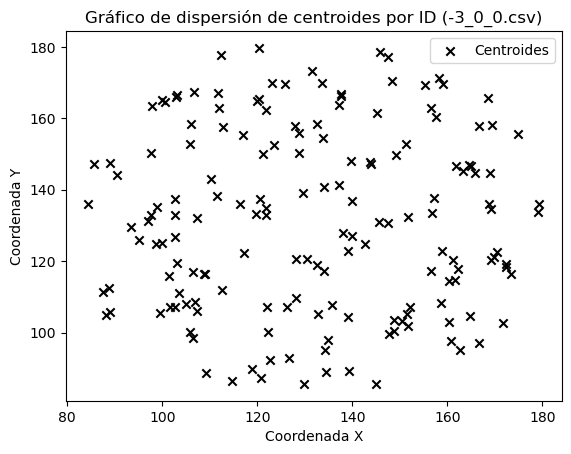

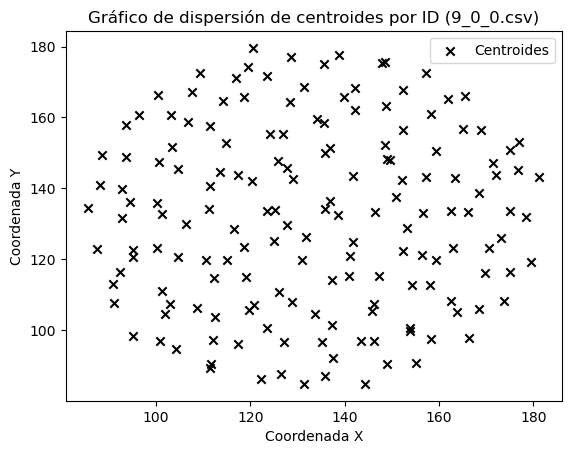

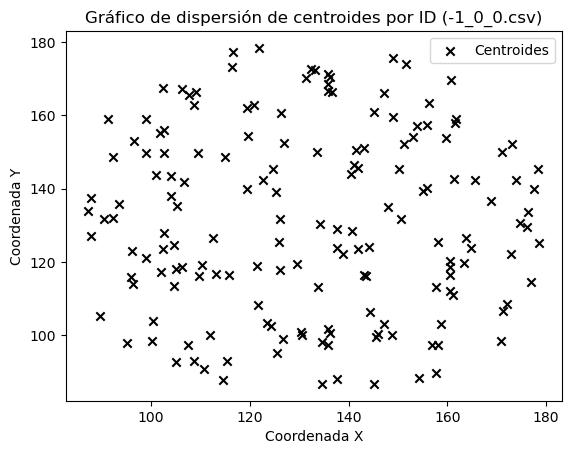

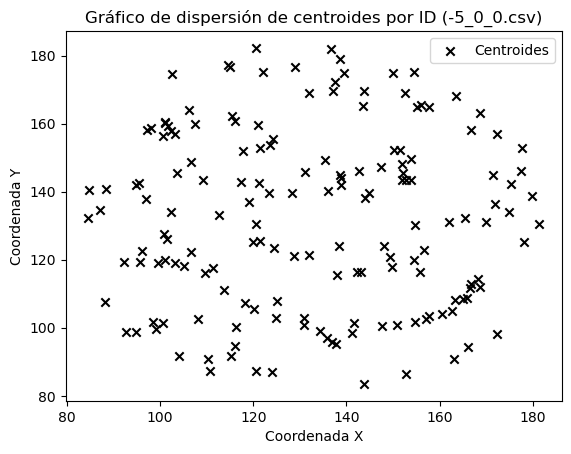

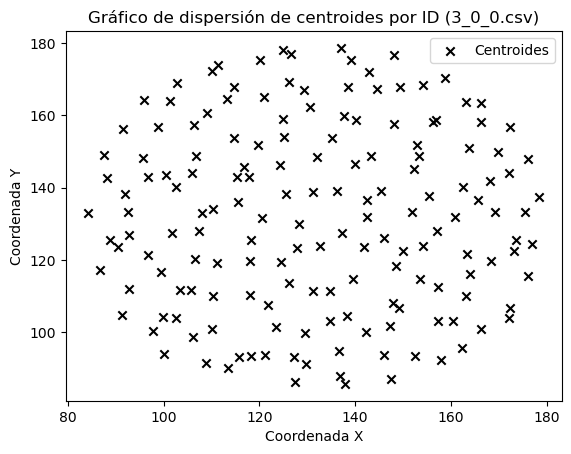

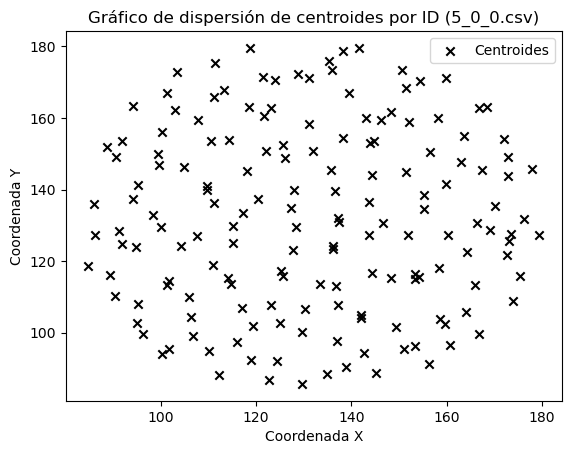

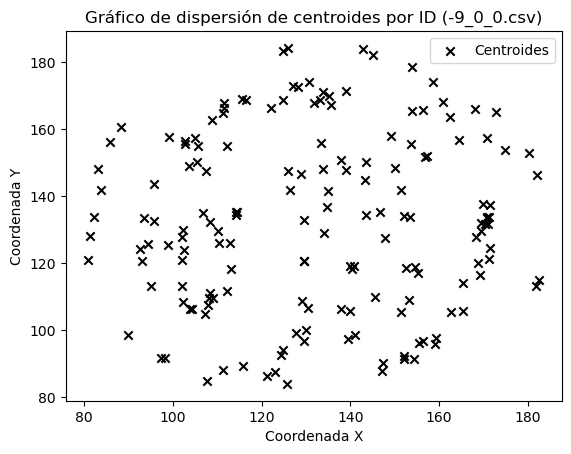

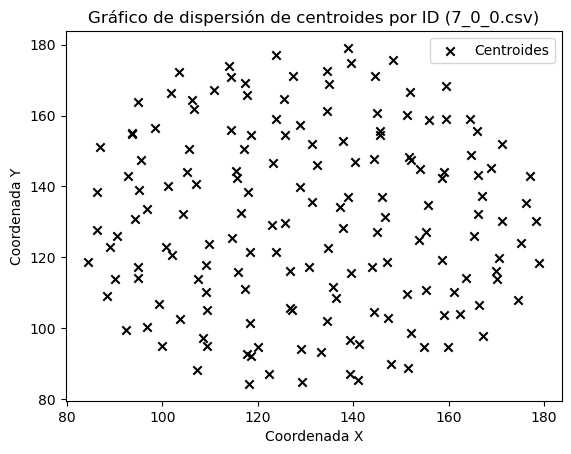

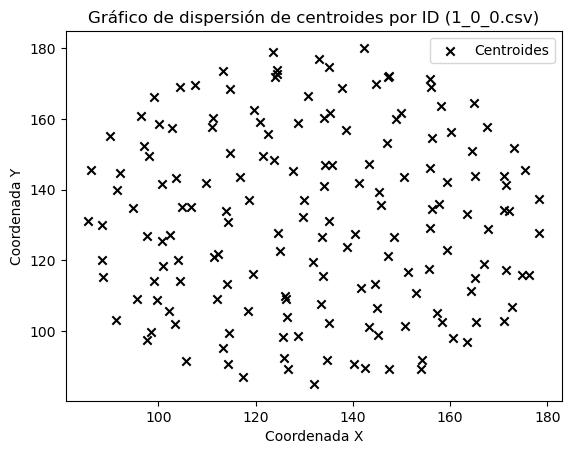

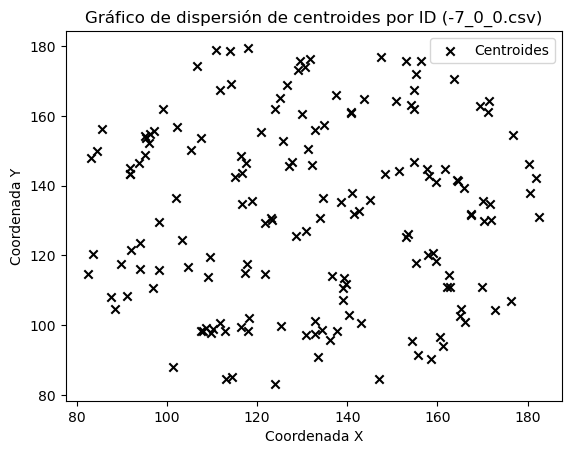

In [3]:
# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    # Construir la ruta completa del archivo
    ruta_completa = os.path.join(ruta_directorio, archivo_csv)
    
       # Leer el archivo CSV y asignar nombres de columnas
    df = pd.read_csv(ruta_completa, header=None)
    nombres_columnas = ['id', 'Tipo', 'X', 'Y', 'Z']  # Reemplazar con los nombres de columnas apropiados
    df.columns = nombres_columnas
    
    
    # Agrupar los datos por el ID
    grupos = df.groupby('id')
    
    # Inicializar listas para almacenar los centroides
    centroides_x = []
    centroides_y = []
    
    # Calcular el centroide para cada grupo
    for id_grupo, grupo in grupos:
        X_grupo = grupo['X']
        Y_grupo = grupo['Y']
        centroid_x_grupo = X_grupo.mean()
        centroid_y_grupo = Y_grupo.mean()
        centroides_x.append(centroid_x_grupo)
        centroides_y.append(centroid_y_grupo)
    
    # Crear el gráfico de dispersión solo con los centroides
    plt.scatter(centroides_x, centroides_y, color='black', marker='x', label='Centroides')  # Agregar los centroides al gráfico
    plt.xlabel('Coordenada X')
    plt.ylabel('Coordenada Y')
    plt.title(f'Gráfico de dispersión de centroides por ID ({archivo_csv})')
    plt.legend()  # Mostrar la leyenda con la etiqueta de los centroides
    plt.show()


In [10]:
# Inicializar una lista para almacenar las matrices de distancias
matrices_distancias = []

# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    # Construir la ruta completa del archivo
    ruta_completa = os.path.join(ruta_directorio, archivo_csv)
    
    # Leer el archivo CSV y asignar nombres de columnas
    df = pd.read_csv(ruta_completa, header=None)
    nombres_columnas = ['id', 'Tipo', 'X', 'Y', 'Z']  # Reemplazar con los nombres de columnas apropiados
    df.columns = nombres_columnas
    
    # Agrupar los datos por el ID
    grupos = df.groupby('id')
    
    # Inicializar listas para almacenar los centroides
    centroides_x = []
    centroides_y = []
    
    # Calcular el centroide para cada grupo
    for id_grupo, grupo in grupos:
        X_grupo = grupo['X']
        Y_grupo = grupo['Y']
        centroid_x_grupo = X_grupo.mean()
        centroid_y_grupo = Y_grupo.mean()
        centroides_x.append(centroid_x_grupo)
        centroides_y.append(centroid_y_grupo)
    
    # Crear un DataFrame para los centroides
    df_centroides = pd.DataFrame({"centroides_x": centroides_x, "centroides_y": centroides_y})
    
    # Calcular la matriz de distancias
    matrix_distance = pdist(df_centroides[['centroides_x', 'centroides_y']], metric='euclidean')
    matrices_distancias.append(squareform(matrix_distance))

# Imprimir las matrices de distancias
for i, matrix in enumerate(matrices_distancias):
    print(f"Matriz de distancias para DataFrame {i+1}:")
    print(matrix)
    print()

    # Iterar sobre cada matriz de distancias
for i, matrix_distance in enumerate(matrices_distancias):
    # Obtener la forma de la matriz de distancias
    forma_matriz = np.shape(matrix_distance)[0]
    print(f"Forma de la matriz de distancias para DataFrame {i+1}: {forma_matriz}")
    
    # Calcular el valor máximo
    maximo = matrix_distance.max()
    print(f"Valor máximo de la matriz de distancias: {maximo}")
    
    # Calcular el valor mínimo
    minimo = matrix_distance.min()
    print(f"Valor mínimo de la matriz de distancias: {minimo}")
    
    # Calcular el promedio
    promedio = matrix_distance.mean()
    print(f"Promedio de la matriz de distancias: {promedio}")

Matriz de distancias para DataFrame 1:
[[ 0.          5.81240657 17.99832409 ... 82.64142441 96.61181137
  97.13935358]
 [ 5.81240657  0.         13.66545691 ... 82.98040715 96.59099327
  97.23690162]
 [17.99832409 13.66545691  0.         ... 74.13509671 86.94152957
  87.79118535]
 ...
 [82.64142441 82.98040715 74.13509671 ...  0.         14.86791475
  14.86024629]
 [96.61181137 96.59099327 86.94152957 ... 14.86791475  0.
   2.05869393]
 [97.13935358 97.23690162 87.79118535 ... 14.86024629  2.05869393
   0.        ]]

Matriz de distancias para DataFrame 2:
[[ 0.          1.08428115 24.48601125 ... 89.08540885 92.50179432
  93.84120704]
 [ 1.08428115  0.         24.5152935  ... 88.02162627 91.44410436
  92.81462643]
 [24.48601125 24.5152935   0.         ... 87.84894764 90.47855384
  89.19612033]
 ...
 [89.08540885 88.02162627 87.84894764 ...  0.          4.20751388
  12.98636518]
 [92.50179432 91.44410436 90.47855384 ...  4.20751388  0.
   9.88864416]
 [93.84120704 92.81462643 89.196120

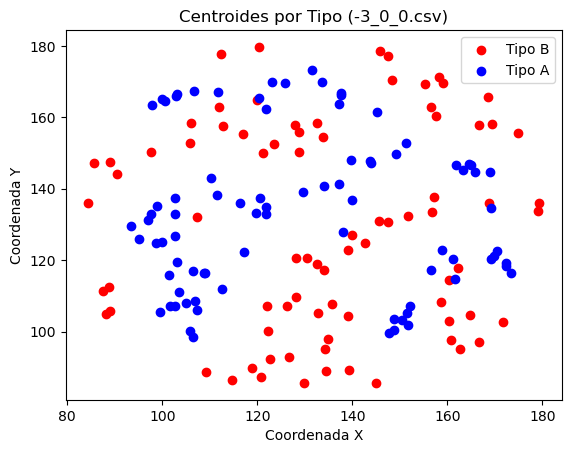

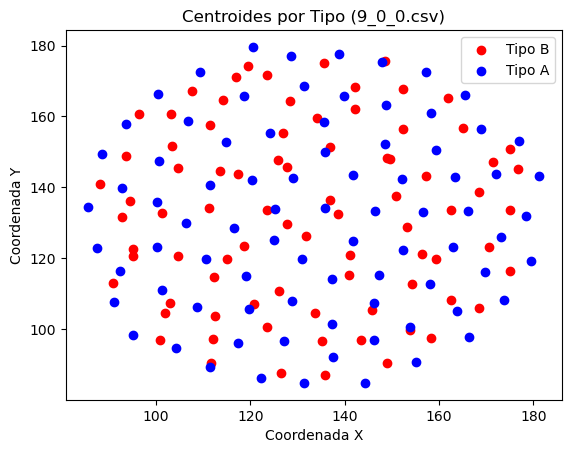

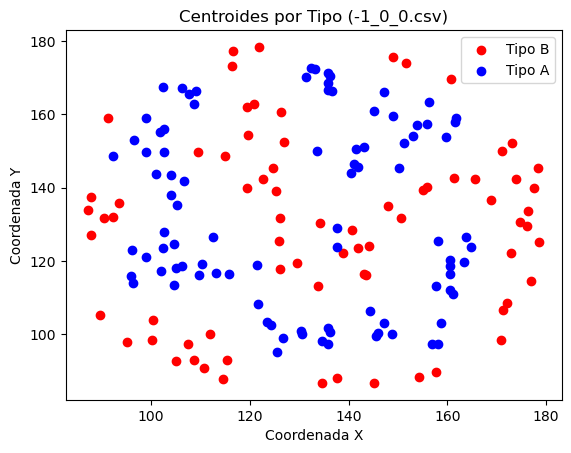

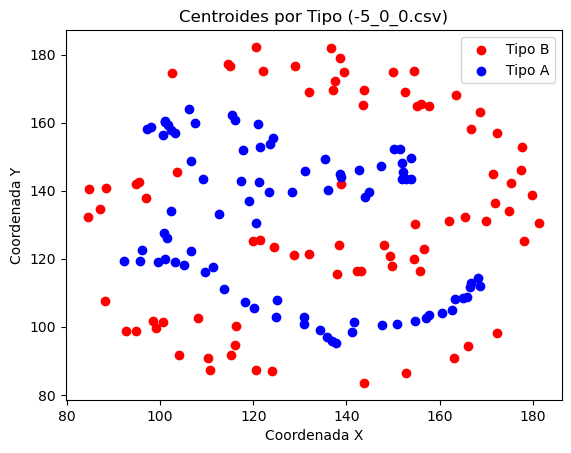

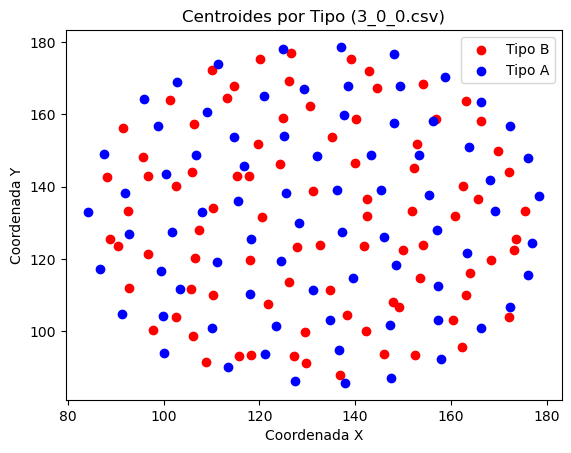

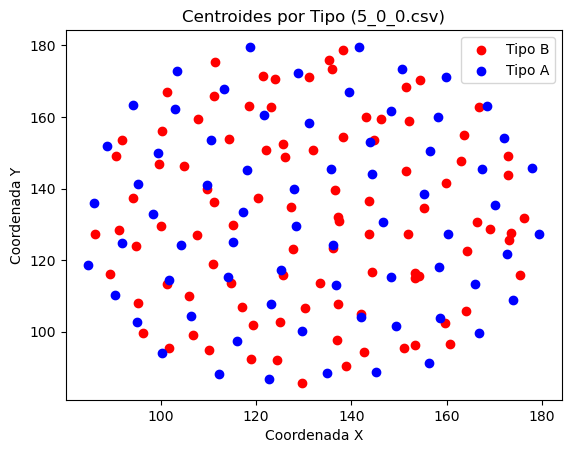

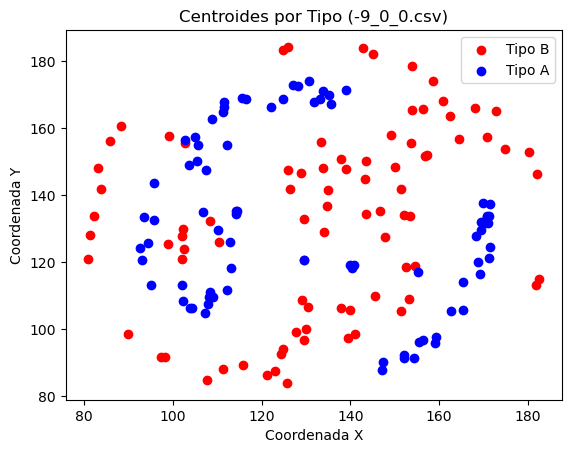

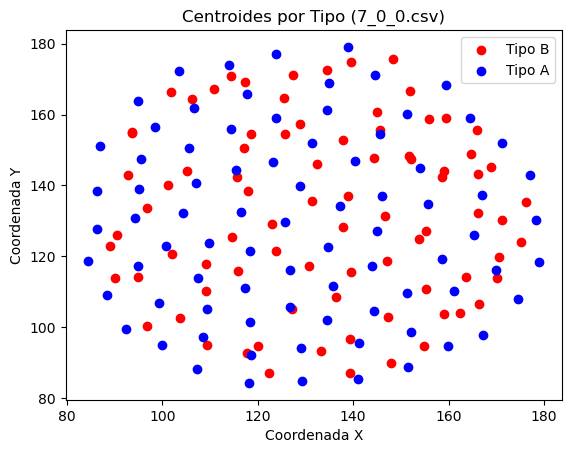

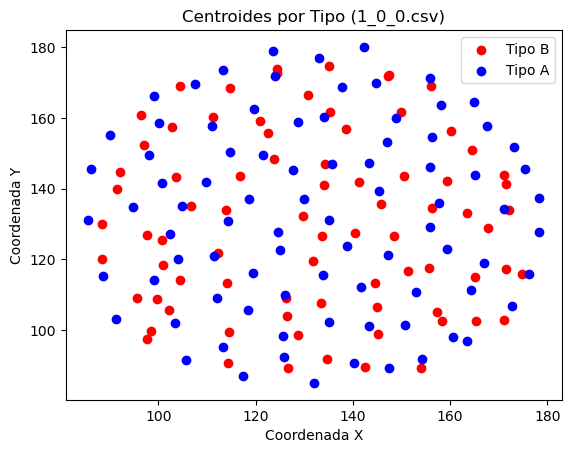

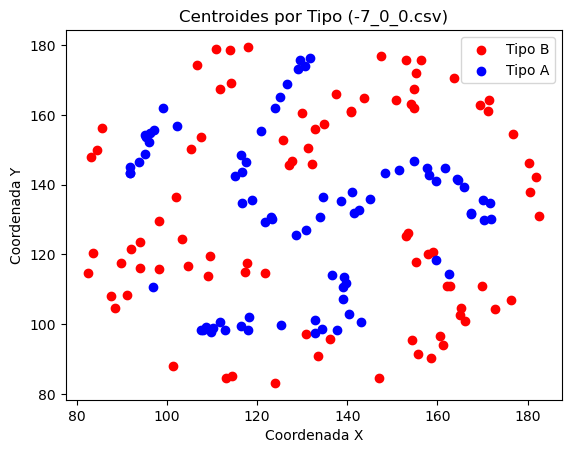

In [4]:
# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    # Construir la ruta completa del archivo
    ruta_completa = os.path.join(ruta_directorio, archivo_csv)
    
    # Leer el archivo CSV y asignar nombres de columnas
    df = pd.read_csv(ruta_completa, header=None)
    nombres_columnas = ['id', 'Tipo', 'X', 'Y', 'Z']  # Reemplazar con los nombres de columnas apropiados
    df.columns = nombres_columnas
    
    # Agrupar los datos por el ID y el Tipo
    grupos = df.groupby(['id', 'Tipo'])
    
    # Inicializar listas para almacenar los centroides y tipos
    centroides_x = []
    centroides_y = []
    tipos_centroides = []
    
    # Calcular el centroide y el tipo para cada grupo
    for (id_grupo, tipo_grupo), grupo in grupos:
        X_grupo = grupo['X']
        Y_grupo = grupo['Y']
        centroid_x_grupo = X_grupo.mean()
        centroid_y_grupo = Y_grupo.mean()
        centroides_x.append(centroid_x_grupo)
        centroides_y.append(centroid_y_grupo)
        tipos_centroides.append(tipo_grupo)  # Guardar el tipo del grupo
    
    # Crear el gráfico de dispersión con centroides rojos y azules
    for tipo in set(tipos_centroides):
        color = 'b' if tipo == 'A' else 'r'  # Rojo para tipo 'A', azul para tipo 'B'
        indices_tipo = [i for i, t in enumerate(tipos_centroides) if t == tipo]
        centroides_x_tipo = [centroides_x[i] for i in indices_tipo]
        centroides_y_tipo = [centroides_y[i] for i in indices_tipo]
        plt.scatter(centroides_x_tipo, centroides_y_tipo, color=color, label=f'Tipo {tipo}')

    plt.xlabel('Coordenada X')
    plt.ylabel('Coordenada Y')
    plt.title(f'Centroides por Tipo ({archivo_csv})')
    plt.legend()
    plt.show()


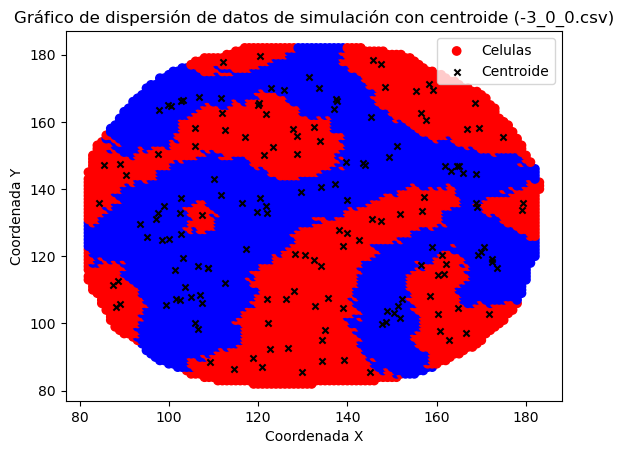

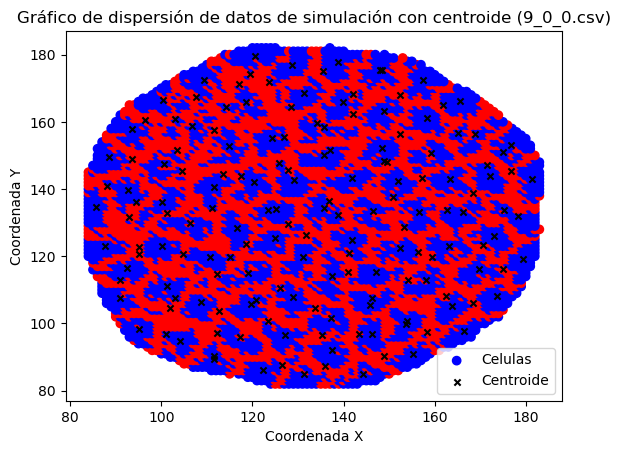

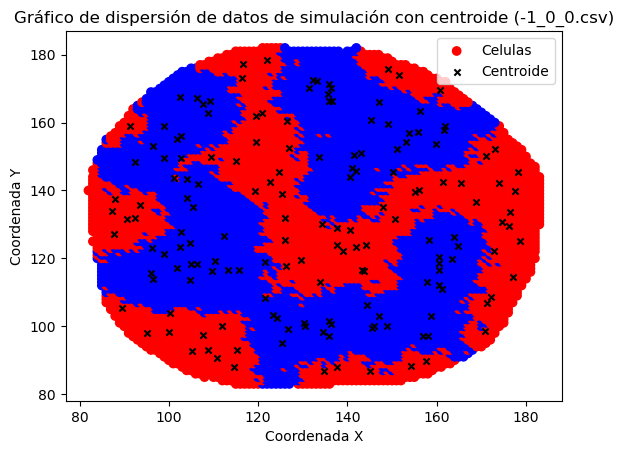

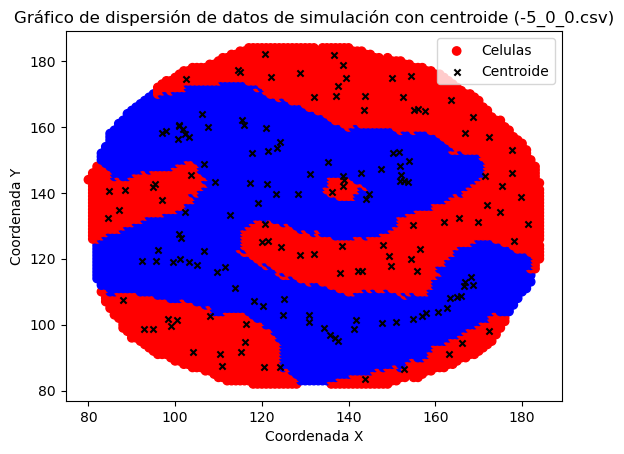

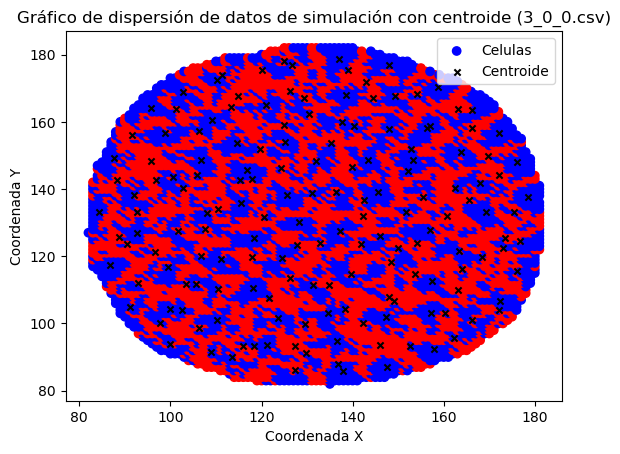

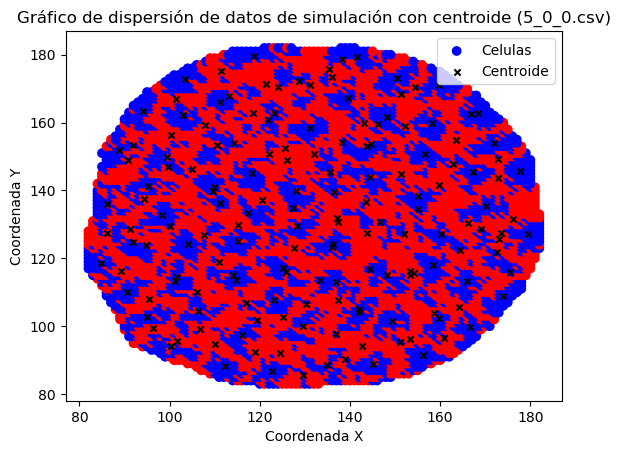

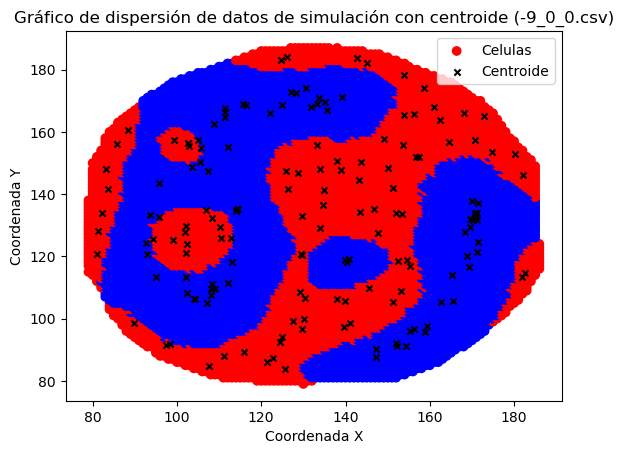

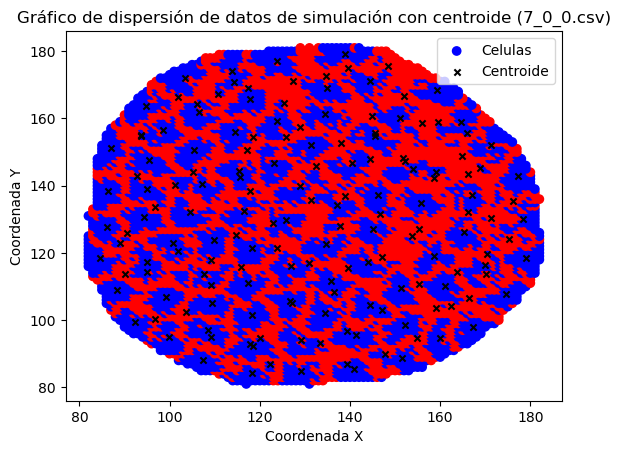

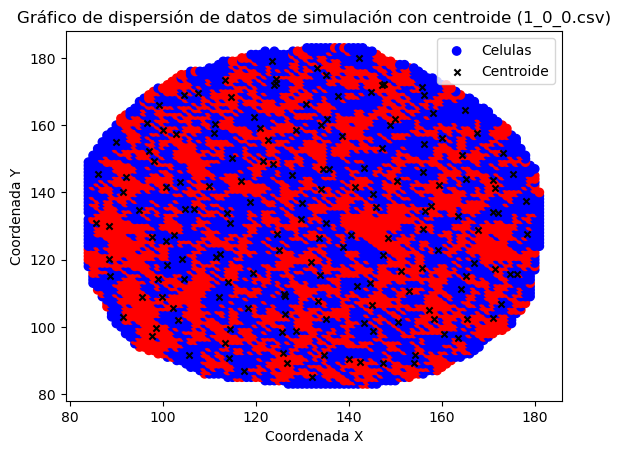

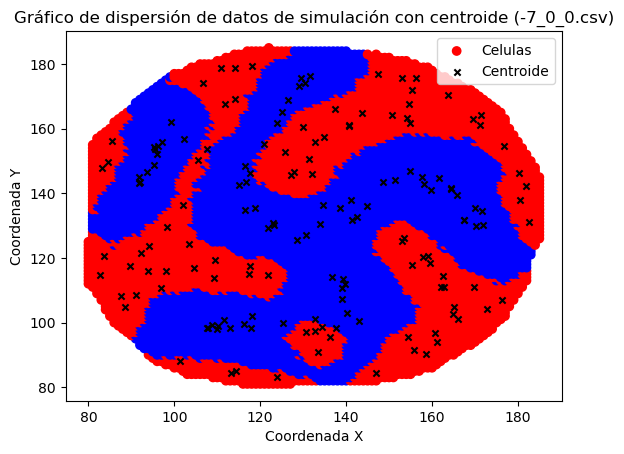

DataFrame 1:
     centroides_x  centroides_y id
0      109.208333     88.520833  B
1      114.620000     86.400000  B
2      126.687500     92.812500  B
3      120.820000     87.160000  B
4      129.755102     85.673469  B
..            ...           ... ..
159    120.340000    179.740000  B
160    131.410714    173.410714  A
161    137.563636    166.145455  A
162    147.468085    177.234043  B
163    145.836735    178.489796  B

[164 rows x 3 columns]

DataFrame 2:
     centroides_x  centroides_y id
0      111.541667     89.291667  A
1      111.627451     90.372549  B
2      135.941176     87.235294  B
3      126.433962     87.735849  B
4      131.319149     84.893617  A
..            ...           ... ..
159    128.708333    177.000000  A
160    128.520000    164.480000  B
161    135.541667    175.083333  B
162    138.862745    177.666667  A
163    148.520000    175.540000  B

[164 rows x 3 columns]

DataFrame 3:
     centroides_x  centroides_y id
0      114.529412     87.862745  B
1

In [7]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Ruta del directorio que contiene los archivos CSV
ruta_directorio = "/home/jupyter-user5/multicellularity_patterns_classification-/Corte1/carpeta_csv"

# Obtener una lista de todos los archivos CSV en la ruta especificada
archivos_csv = [archivo for archivo in os.listdir(ruta_directorio) if archivo.endswith('.csv')]

# Inicializar una lista para almacenar los DataFrames
dataframes = []

# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    # Construir la ruta completa del archivo
    ruta_completa = os.path.join(ruta_directorio, archivo_csv)
    
    # Leer el archivo CSV y asignar nombres de columnas
    df = pd.read_csv(ruta_completa, header=None)
    nombres_columnas = ['id', 'Tipo', 'X', 'Y', 'Z']  # Reemplazar con los nombres de columnas apropiados
    df.columns = nombres_columnas
    
    # Extraer las coordenadas X e Y y el tipo
    X = df['X']
    Y = df['Y']
    tipo = df['Tipo']
    
    # Crear un mapa de colores basado en los tipos
    colores = {'A': 'b', 'B': 'r'}  # Ajusta los colores según tus necesidades
    
    # Asignar colores a cada punto según el tipo
    colores_puntos = [colores[t] for t in tipo]
    
    # Agrupar los datos por el ID
    grupos = df.groupby('id')
    
    # Inicializar listas para almacenar los centroides
    centroides_x = []
    centroides_y = []
    tipos_centroides = []
    
    # Calcular el centroide para cada grupo
    for id_grupo, grupo in grupos:
        X_grupo = grupo['X']
        Y_grupo = grupo['Y']
        centroid_x_grupo = X_grupo.mean()
        centroid_y_grupo = Y_grupo.mean()
        centroides_x.append(centroid_x_grupo)
        centroides_y.append(centroid_y_grupo)
        # Suponiendo que el tipo del centroide es el tipo más frecuente en el grupo
        tipo_centroide = grupo['Tipo'].mode()[0]
        tipos_centroides.append(tipo_centroide)
    
    # Crear el gráfico de dispersión combinado
    plt.scatter(X, Y, c=colores_puntos, label='Celulas')
    plt.scatter(centroides_x, centroides_y, color='black', marker='x', s=20, label='Centroide')  # Agregar el centroide al gráfico
    
    plt.xlabel('Coordenada X')
    plt.ylabel('Coordenada Y')
    plt.title(f'Gráfico de dispersión de datos de simulación con centroide ({archivo_csv})')
    plt.legend() 
    plt.show()
    
    # Crear un DataFrame para cada lista de centroides
    df_centroides = pd.DataFrame({"centroides_x": centroides_x, "centroides_y": centroides_y, "id": tipos_centroides})
    dataframes.append(df_centroides)

# Imprimir los DataFrames
for i, df in enumerate(dataframes):
    print(f"DataFrame {i+1}:")
    print(df)
    print()


usetex mode requires TeX.


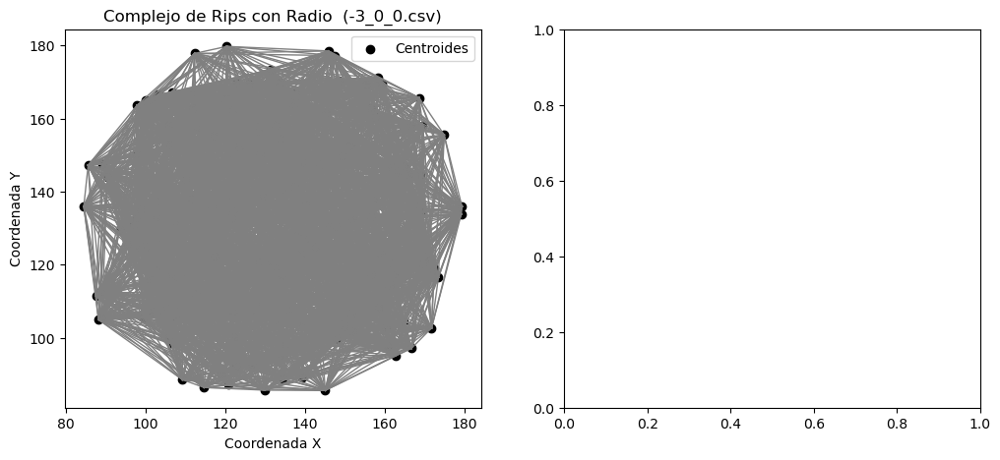

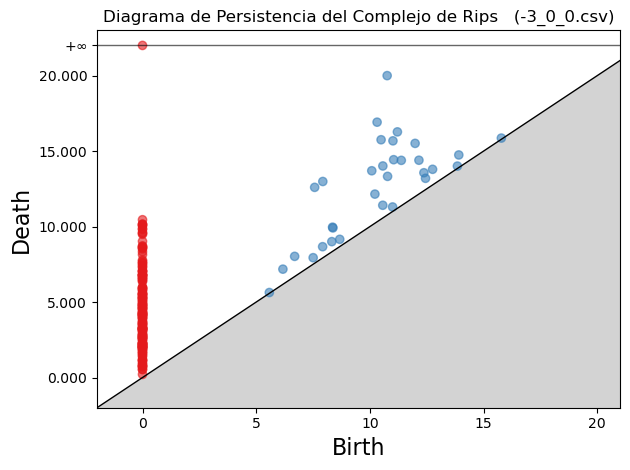

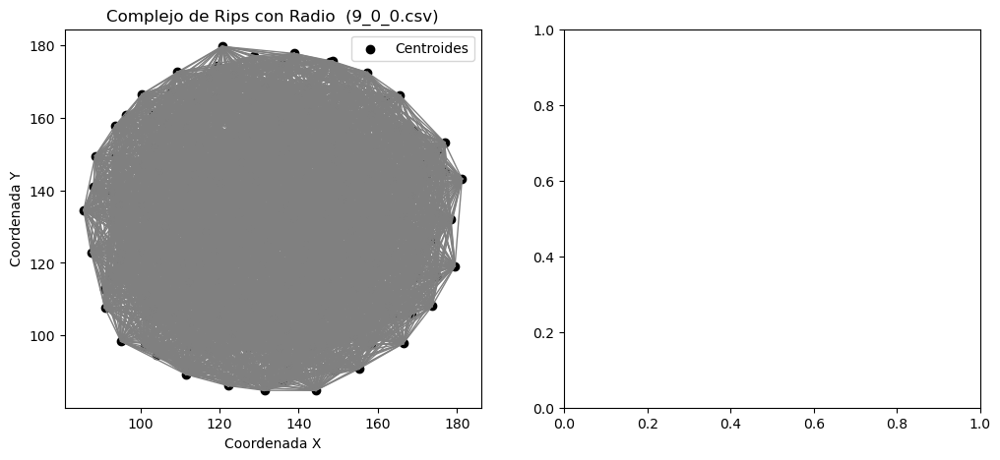

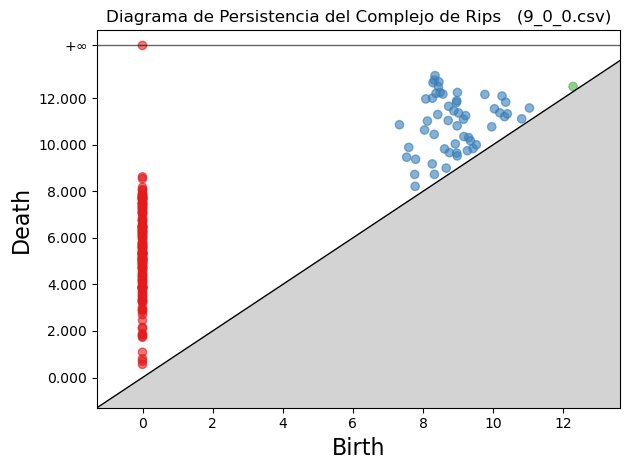

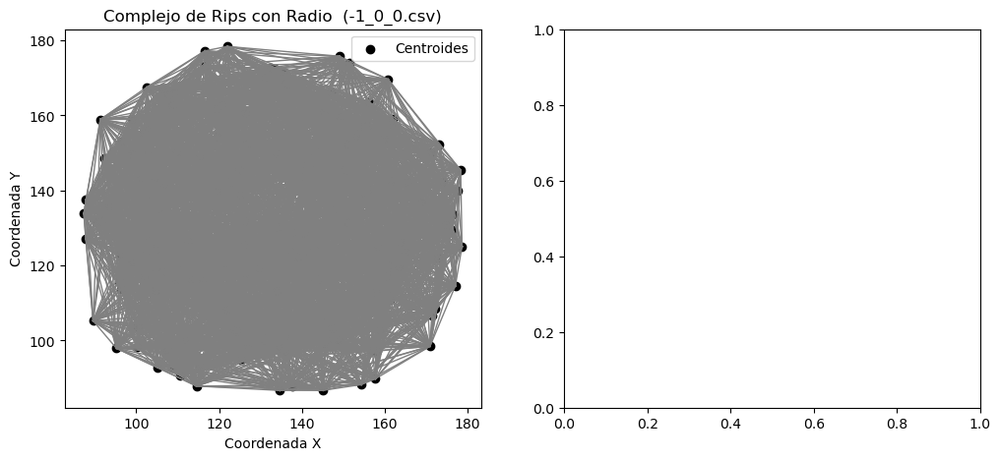

...

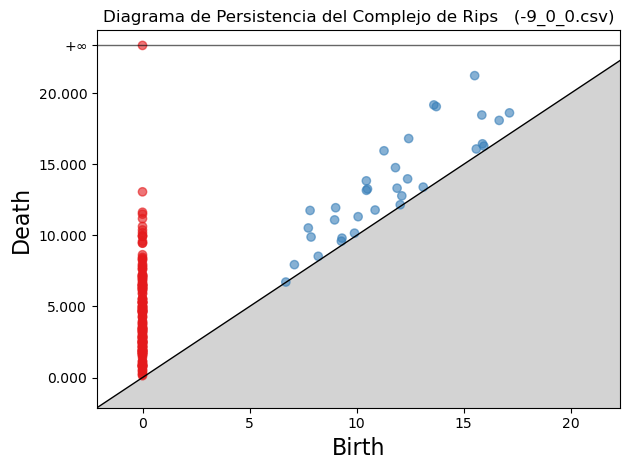

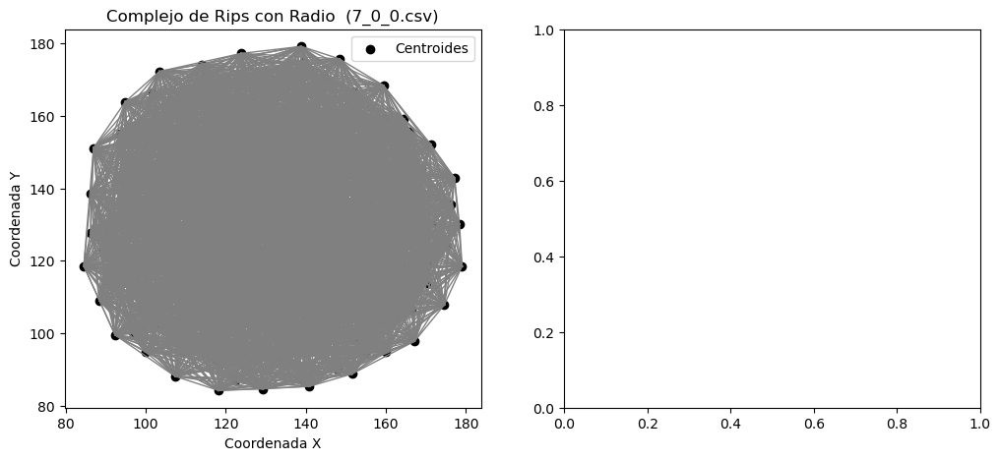

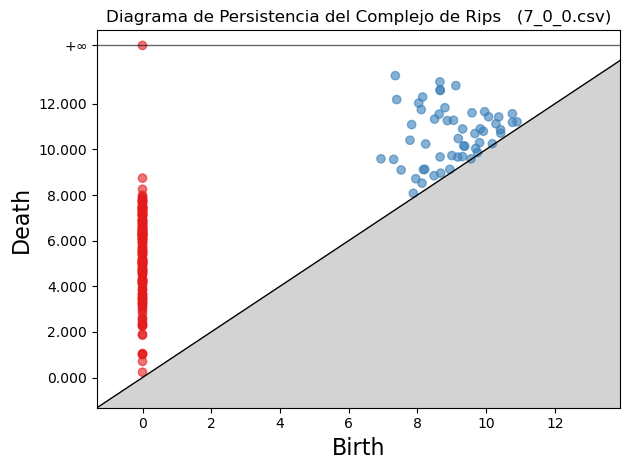

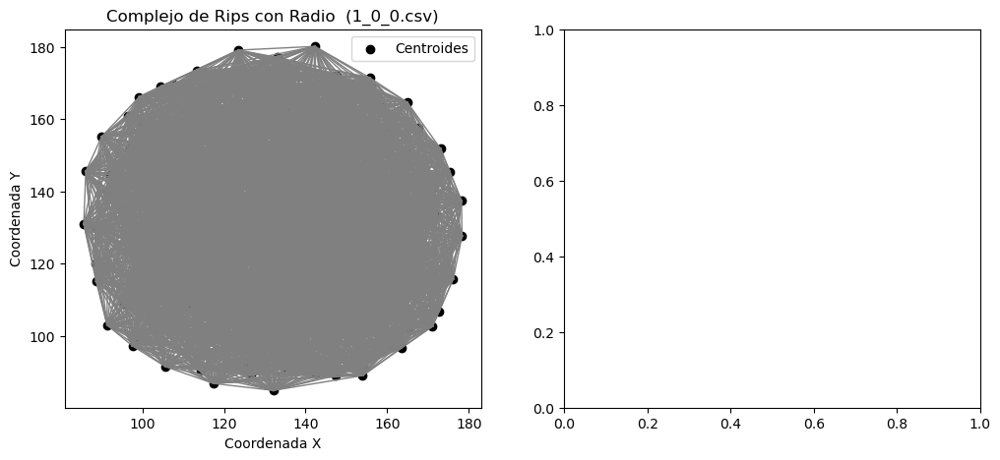

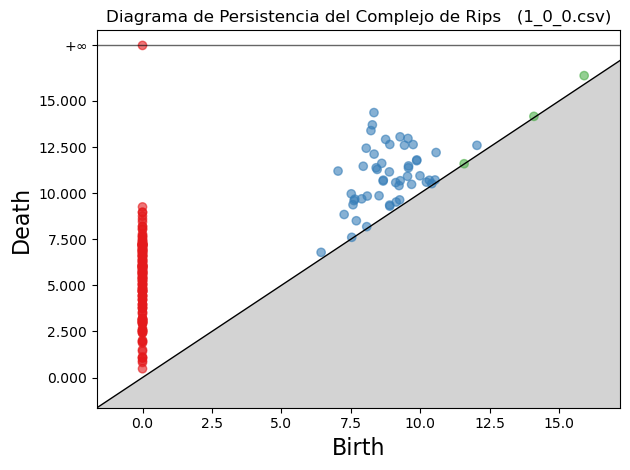

In [ ]:
# Crear la carpeta para guardar los diagramas de persistencia si no existe
ruta_salida = "prueba_distancia"
if not os.path.exists(ruta_salida):
    os.makedirs(ruta_salida)

# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    # Construir la ruta completa del archivo
    ruta_completa = os.path.join(ruta_directorio, archivo_csv)
    
    # Leer el archivo CSV y asignar nombres de columnas
    df = pd.read_csv(ruta_completa, header=None)
    nombres_columnas = ['id', 'Tipo', 'X', 'Y', 'Z']  # Reemplazar con los nombres de columnas apropiados
    df.columns = nombres_columnas
    
    # Agrupar los datos por el ID
    grupos = df.groupby('id')
    
    # Inicializar listas para almacenar los centroides
    centroides_x = []
    centroides_y = []
    
    # Calcular el centroide para cada grupo
    for id_grupo, grupo in grupos:
        X_grupo = grupo['X']
        Y_grupo = grupo['Y']
        centroid_x_grupo = X_grupo.mean()
        centroid_y_grupo = Y_grupo.mean()
        centroides_x.append(centroid_x_grupo)
        centroides_y.append(centroid_y_grupo)
    
    # Convertir las coordenadas de los centroides a un formato adecuado para gudhi
    puntos = np.array(list(zip(centroides_x, centroides_y)))

    # Calcular el complejo de Rips con un radio específico
    rips_complex = gd.RipsComplex(points=puntos, max_edge_length=40)
    simplex_tree = rips_complex.create_simplex_tree(max_dimension=3)

    # Visualizar el complejo de Rips
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.scatter(centroides_x, centroides_y, color='black', label='Centroides')
    for simplex in simplex_tree.get_skeleton(1):  # Obtener las aristas
        if len(simplex[0]) == 2:  # Asegurarse de que solo sean aristas
            arista = simplex[0]
            x = [centroides_x[i] for i in arista]
            y = [centroides_y[i] for i in arista]
            plt.plot(x, y, color='gray', linestyle='-', linewidth=1)
    plt.xlabel('Coordenada X')
    plt.ylabel('Coordenada Y')
    plt.title(f'Complejo de Rips con Radio  ({archivo_csv})')
    plt.legend()

    # Calcular el diagrama de persistencia
    diag = simplex_tree.persistence()

       

    # Mostrar el diagrama de dispersión de persistencia
    plt.subplot(1, 2, 2)
    gd.plot_persistence_diagram(diag)
    plt.title(f'Diagrama de Persistencia del Complejo de Rips   ({archivo_csv})')
    plt.xlabel('Birth')
    plt.ylabel('Death')

    plt.tight_layout()
    plt.show()


In [12]:
# Almacenar los diagramas de persistencia y los nombres de los archivos
diagramas_persistencia = {}
diagramas_persistencia_0 = {}

# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    try:
        # Construir la ruta completa del archivo
        ruta_completa = os.path.join(ruta_directorio, archivo_csv)
        
        # Leer el archivo CSV y asignar nombres de columnas
        df = pd.read_csv(ruta_completa, header=None)
        nombres_columnas = ['id', 'Tipo', 'X', 'Y', 'Z']  # Reemplazar con los nombres de columnas apropiados
        df.columns = nombres_columnas
        
        # Agrupar los datos por el ID
        grupos = df.groupby('id')
        
        # Inicializar listas para almacenar los centroides
        centroides_x = []
        centroides_y = []
        
        # Calcular el centroide para cada grupo
        for id_grupo, grupo in grupos:
            X_grupo = grupo['X']
            Y_grupo = grupo['Y']
            centroid_x_grupo = X_grupo.mean()
            centroid_y_grupo = Y_grupo.mean()
            centroides_x.append(centroid_x_grupo)
            centroides_y.append(centroid_y_grupo)
        
        # Convertir las coordenadas de los centroides a un formato adecuado para gudhi
        puntos = np.array(list(zip(centroides_x, centroides_y)))

        # Calcular el complejo de Rips con un radio específico
        rips_complex = gd.RipsComplex(points=puntos, max_edge_length=40)
        simplex_tree = rips_complex.create_simplex_tree(max_dimension=3)

        # Calcular el diagrama de persistencia
        diag = simplex_tree.persistence()

        # Almacenar los diagramas de persistencia
        diagramas_persistencia[archivo_csv] = simplex_tree.persistence_intervals_in_dimension(1)
        diagramas_persistencia_0[archivo_csv] = simplex_tree.persistence_intervals_in_dimension(0)
        
    except Exception as e:
        print(f"Error al procesar el archivo {archivo_csv}: {e}")

# Calcular las distancias de Bottleneck entre todos los pares de diagramas de persistencia
archivos = list(diagramas_persistencia.keys())
n = len(archivos)
tolerancia = 1e-10  # Tolerancia para considerar distancias efectivamente como cero

# Inicializar matrices de distancias
distancias_dim1 = np.zeros((n, n))
distancias_dim0 = np.zeros((n, n))

for i in range(n):
    for j in range(i, n):
        archivo_i = archivos[i]
        archivo_j = archivos[j]
        diag_i = diagramas_persistencia[archivo_i]
        diag_j = diagramas_persistencia[archivo_j]
        diag_i_0 = diagramas_persistencia_0[archivo_i]
        diag_j_0 = diagramas_persistencia_0[archivo_j]
        
        distancia_bottleneck = gd.bottleneck_distance(diag_i, diag_j)
        distancia_bottleneck_0 = gd.bottleneck_distance(diag_i_0, diag_j_0)
        
        distancias_dim1[i, j] = distancia_bottleneck
        distancias_dim1[j, i] = distancia_bottleneck
        distancias_dim0[i, j] = distancia_bottleneck_0
        distancias_dim0[j, i] = distancia_bottleneck_0
        
        # Verificar que la distancia de Bottleneck para el mismo archivo es efectivamente cero
        if i == j:
            if distancia_bottleneck < tolerancia:
                print(f"Distancia de Bottleneck (Dimensión 1) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Bottleneck (Dimensión 1) para {archivo_i} no es cero: {distancia_bottleneck}")
            
            if distancia_bottleneck_0 < tolerancia:
                print(f"Distancia de Bottleneck (Dimensión 0) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Bottleneck (Dimensión 0) para {archivo_i} no es cero: {distancia_bottleneck_0}")



Distancia de Bottleneck (Dimensión 1) para -3_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para -3_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para 9_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para 9_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para -1_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para -1_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para -5_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para -5_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para 3_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para 3_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para 5_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para 5_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para -9_0_0.csv es efectivamente cero.
Dista

In [13]:
import gudhi.wasserstein as gw  # Importar el submódulo correcto

# Almacenar los diagramas de persistencia y los nombres de los archivos
diagramas_persistencia = {}
diagramas_persistencia_0 = {}

# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    try:
        # Construir la ruta completa del archivo
        ruta_completa = os.path.join(ruta_directorio, archivo_csv)
        
        # Leer el archivo CSV y asignar nombres de columnas
        df = pd.read_csv(ruta_completa, header=None)
        nombres_columnas = ['id', 'Tipo', 'X', 'Y', 'Z']  # Reemplazar con los nombres de columnas apropiados
        df.columns = nombres_columnas
        
        # Agrupar los datos por el ID
        grupos = df.groupby('id')
        
        # Inicializar listas para almacenar los centroides
        centroides_x = []
        centroides_y = []
        
        # Calcular el centroide para cada grupo
        for id_grupo, grupo in grupos:
            X_grupo = grupo['X']
            Y_grupo = grupo['Y']
            centroid_x_grupo = X_grupo.mean()
            centroid_y_grupo = Y_grupo.mean()
            centroides_x.append(centroid_x_grupo)
            centroides_y.append(centroid_y_grupo)
        
        # Convertir las coordenadas de los centroides a un formato adecuado para gudhi
        puntos = np.array(list(zip(centroides_x, centroides_y)))

        # Calcular el complejo de Rips con un radio específico
        rips_complex = gd.RipsComplex(points=puntos, max_edge_length=40)
        simplex_tree = rips_complex.create_simplex_tree(max_dimension=3)

        # Calcular el diagrama de persistencia
        diag = simplex_tree.persistence()

        # Almacenar los diagramas de persistencia
        diagramas_persistencia[archivo_csv] = simplex_tree.persistence_intervals_in_dimension(1)
        diagramas_persistencia_0[archivo_csv] = simplex_tree.persistence_intervals_in_dimension(0)
        
    except Exception as e:
        print(f"Error al procesar el archivo {archivo_csv}: {e}")

# Calcular las distancias de Wasserstein entre todos los pares de diagramas de persistencia
archivos = list(diagramas_persistencia.keys())
n = len(archivos)
tolerancia = 1e-10  # Tolerancia para considerar distancias efectivamente como cero

# Inicializar matrices de distancias de Wasserstein
distancias_wasserstein_dim1 = np.zeros((n, n))
distancias_wasserstein_dim0 = np.zeros((n, n))

for i in range(n):
    for j in range(i, n):
        archivo_i = archivos[i]
        archivo_j = archivos[j]
        diag_i = diagramas_persistencia[archivo_i]
        diag_j = diagramas_persistencia[archivo_j]
        diag_i_0 = diagramas_persistencia_0[archivo_i]
        diag_j_0 = diagramas_persistencia_0[archivo_j]
        
        # Calcular la distancia de Wasserstein usando el submódulo correcto
        distancia_wasserstein = gw.wasserstein_distance(diag_i, diag_j, order=1)  # 'order' puede ser 1 o 2
        distancia_wasserstein_0 = gw.wasserstein_distance(diag_i_0, diag_j_0, order=1)
        
        # Almacenar las distancias en las matrices
        distancias_wasserstein_dim1[i, j] = distancia_wasserstein
        distancias_wasserstein_dim1[j, i] = distancia_wasserstein
        distancias_wasserstein_dim0[i, j] = distancia_wasserstein_0
        distancias_wasserstein_dim0[j, i] = distancia_wasserstein_0
        
        # Verificar que las distancias de Wasserstein para el mismo archivo son efectivamente cero
        if i == j:
            if distancia_wasserstein < tolerancia:
                print(f"Distancia de Wasserstein (Dimensión 1) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Wasserstein (Dimensión 1) para {archivo_i} no es cero: {distancia_wasserstein}")
                
            if distancia_wasserstein_0 < tolerancia:
                print(f"Distancia de Wasserstein (Dimensión 0) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Wasserstein (Dimensión 0) para {archivo_i} no es cero: {distancia_wasserstein_0}")


Distancia de Wasserstein (Dimensión 1) para -3_0_0.csv es efectivamente cero.
Distancia de Wasserstein (Dimensión 0) para -3_0_0.csv es efectivamente cero.
Distancia de Wasserstein (Dimensión 1) para 9_0_0.csv es efectivamente cero.
Distancia de Wasserstein (Dimensión 0) para 9_0_0.csv es efectivamente cero.
Distancia de Wasserstein (Dimensión 1) para -1_0_0.csv es efectivamente cero.
Distancia de Wasserstein (Dimensión 0) para -1_0_0.csv es efectivamente cero.
Distancia de Wasserstein (Dimensión 1) para -5_0_0.csv es efectivamente cero.
Distancia de Wasserstein (Dimensión 0) para -5_0_0.csv es efectivamente cero.
Distancia de Wasserstein (Dimensión 1) para 3_0_0.csv es efectivamente cero.
Distancia de Wasserstein (Dimensión 0) para 3_0_0.csv es efectivamente cero.
Distancia de Wasserstein (Dimensión 1) para 5_0_0.csv es efectivamente cero.
Distancia de Wasserstein (Dimensión 0) para 5_0_0.csv es efectivamente cero.
Distancia de Wasserstein (Dimensión 1) para -9_0_0.csv es efectivament

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Función para separar los niveles de adhesividad y devolver una lista con los tres valores
def extract_levels(filename):
    # Elimina la extensión si la hay y separa por "_"
    parts = filename.replace('.csv', '').split('_')
    return [int(parts[0]), int(parts[1]), int(parts[2])]

# Función para ordenar los nombres de archivos
def sort_filenames(filenames):
    # Extrae los niveles y ordena
    sorted_filenames = sorted(filenames, key=extract_levels)
    return sorted_filenames

# Función para reordenar la matriz de acuerdo con los nombres ordenados
def reorder_matrix(matrix, filenames):
    # Obtén los índices de los nombres ordenados
    sorted_filenames = sort_filenames(filenames)
    indices = [filenames.index(name) for name in sorted_filenames]
    # Reordena la matriz
    reordered_matrix = matrix[np.ix_(indices, indices)]
    return reordered_matrix, sorted_filenames

# Visualizar las matrices de distancias como heatmaps y clustermaps
def plot_heatmap_and_clustermap(matrix, filenames, title):
    # Ordena la matriz y los nombres de archivos
    reordered_matrix, sorted_filenames = reorder_matrix(matrix, filenames)
    
    # Aumentar el tamaño de la figura para mejorar la legibilidad
    plt.figure(figsize=(15, 12))  
    sns.heatmap(reordered_matrix, 
                xticklabels=sorted_filenames, 
                yticklabels=sorted_filenames, 
                cmap='viridis', 
                annot=False,  
                fmt=".2f", 
                annot_kws={"size": 8},  
                cbar_kws={'label': 'Distancia Bottleneck'})  
    plt.xticks(rotation=90, fontsize=8)  
    plt.yticks(fontsize=8)  
    plt.title(f"Heatmap de {title}")
    plt.tight_layout()  
    plt.show()

    # Crear clustermap con opciones mejoradas
    clustermap = sns.clustermap(reordered_matrix, 
                                xticklabels=sorted_filenames, 
                                yticklabels=sorted_filenames, 
                                cmap='viridis', 
                                annot=False,  
                                fmt=".2f", 
                                annot_kws={"size": 8},
                                figsize=(15, 12),  
                                dendrogram_ratio=(.1, .2),  
                                cbar_pos=(0, .2, .03, .4),  
                                cbar_kws={'label': 'Distancia Bottleneck'})

    clustermap.ax_heatmap.set_xticklabels(
        clustermap.ax_heatmap.get_xticklabels(), 
        rotation=90, 
        fontsize=6)  

    clustermap.ax_heatmap.set_yticklabels(
        clustermap.ax_heatmap.get_yticklabels(), 
        rotation=0, 
        fontsize=6)  

    plt.title(f"Clustermap de {title}", pad=80)  
    plt.show()


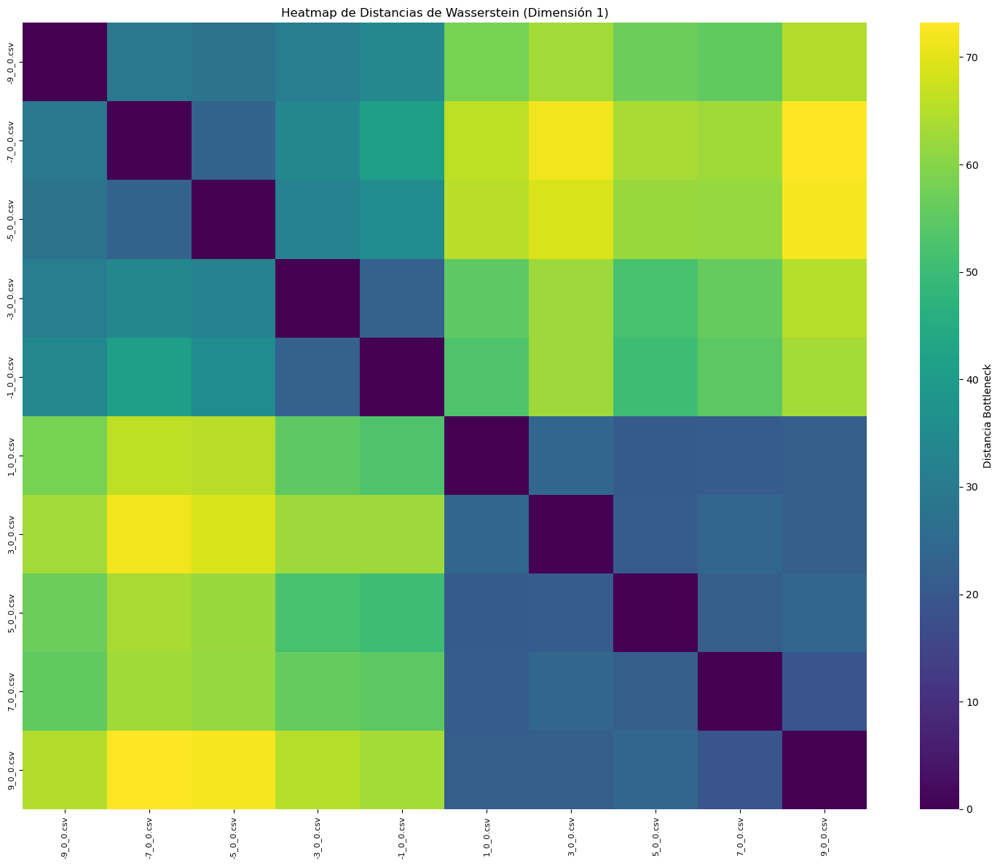

/opt/conda/envs/TDA/lib/python3.7/site-packages/seaborn/matrix.py:531: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  metric=self.metric)


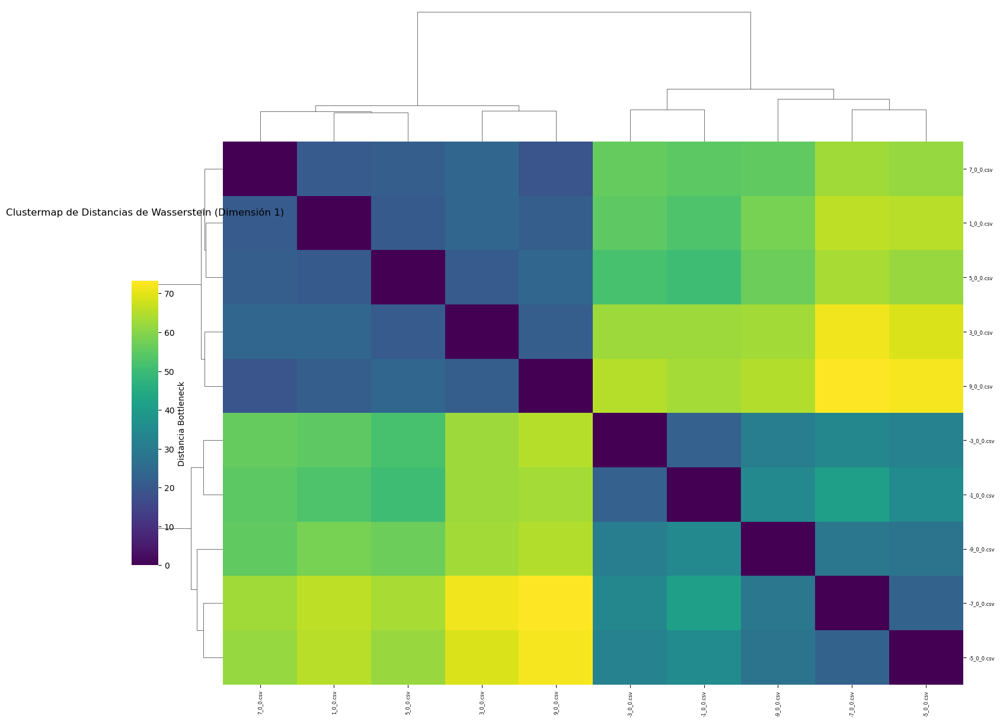

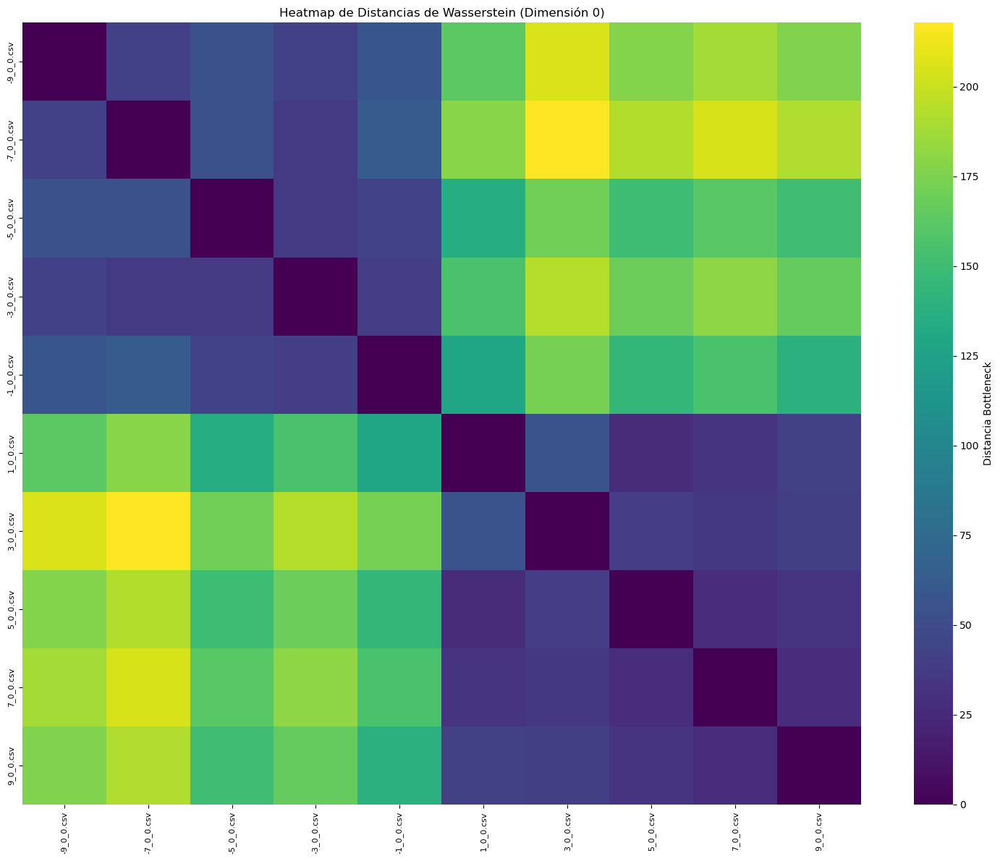

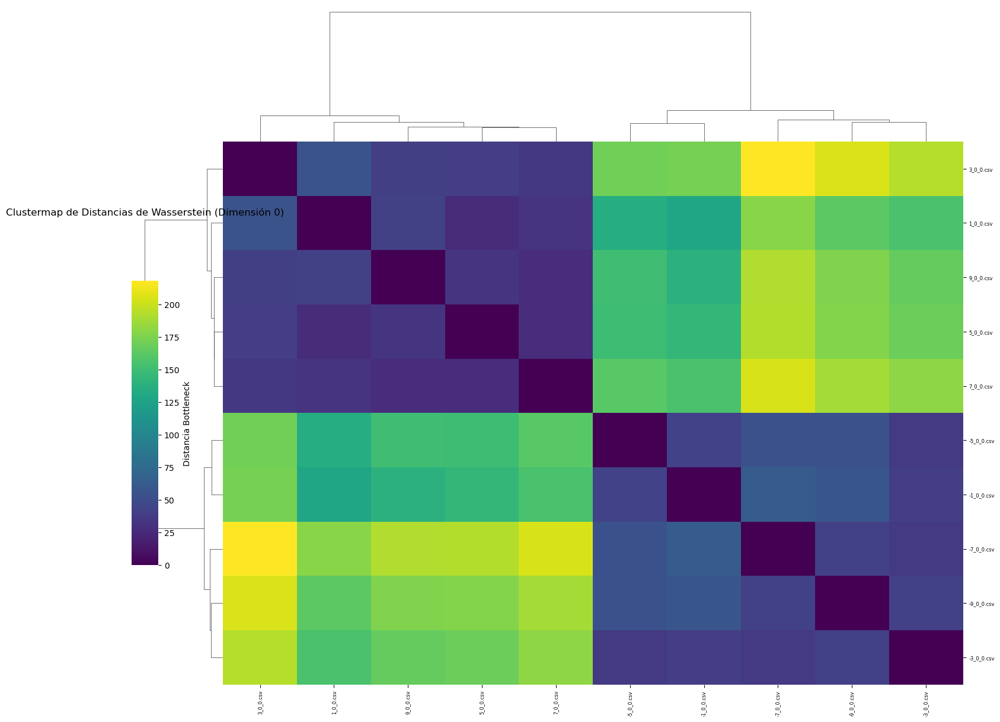

In [15]:
# Llamar a la función pasando las matrices de distancias y la lista de nombres de archivos
plot_heatmap_and_clustermap(distancias_wasserstein_dim1, archivos, "Distancias de Wasserstein (Dimensión 1)")
plot_heatmap_and_clustermap(distancias_wasserstein_dim0, archivos, "Distancias de Wasserstein (Dimensión 0)")


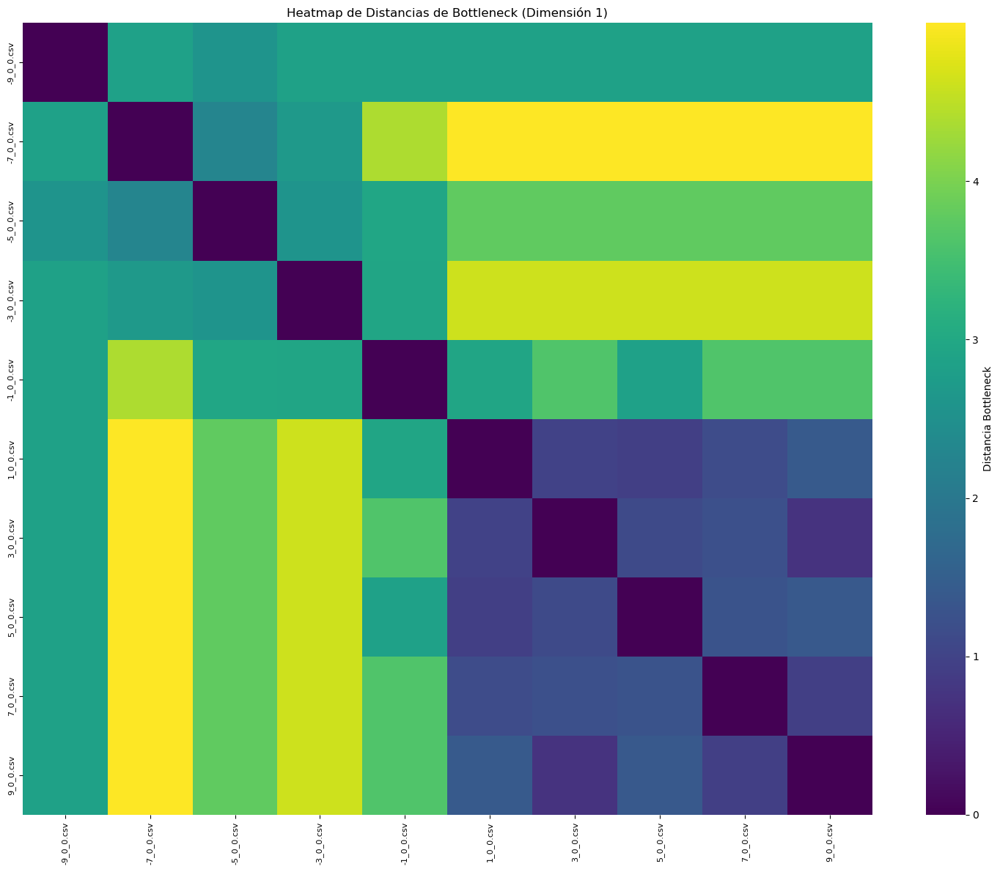

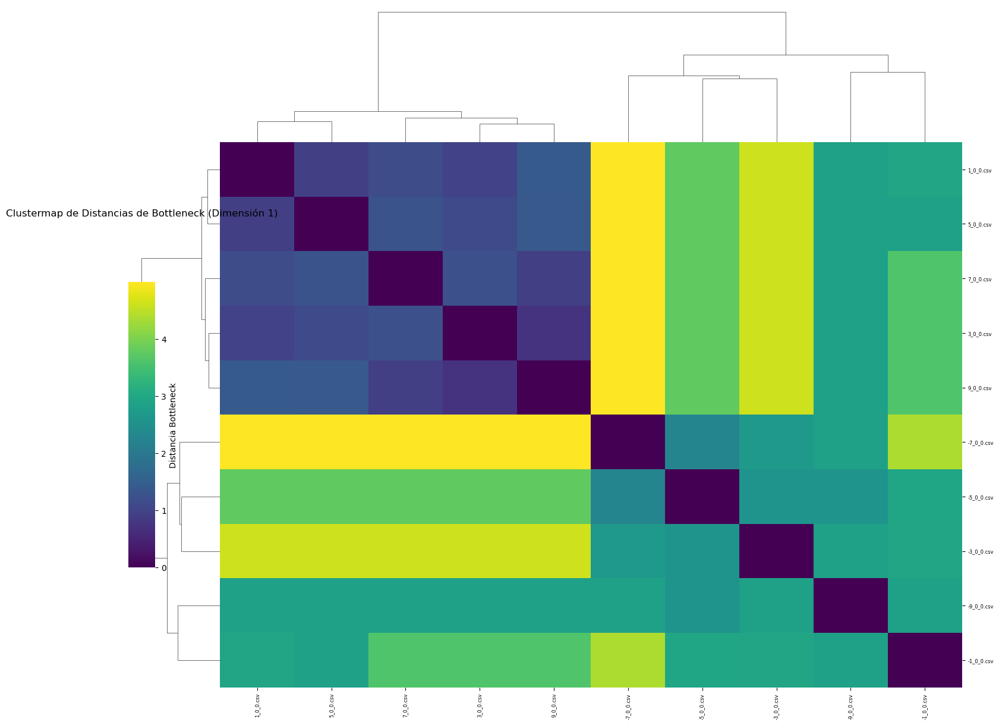

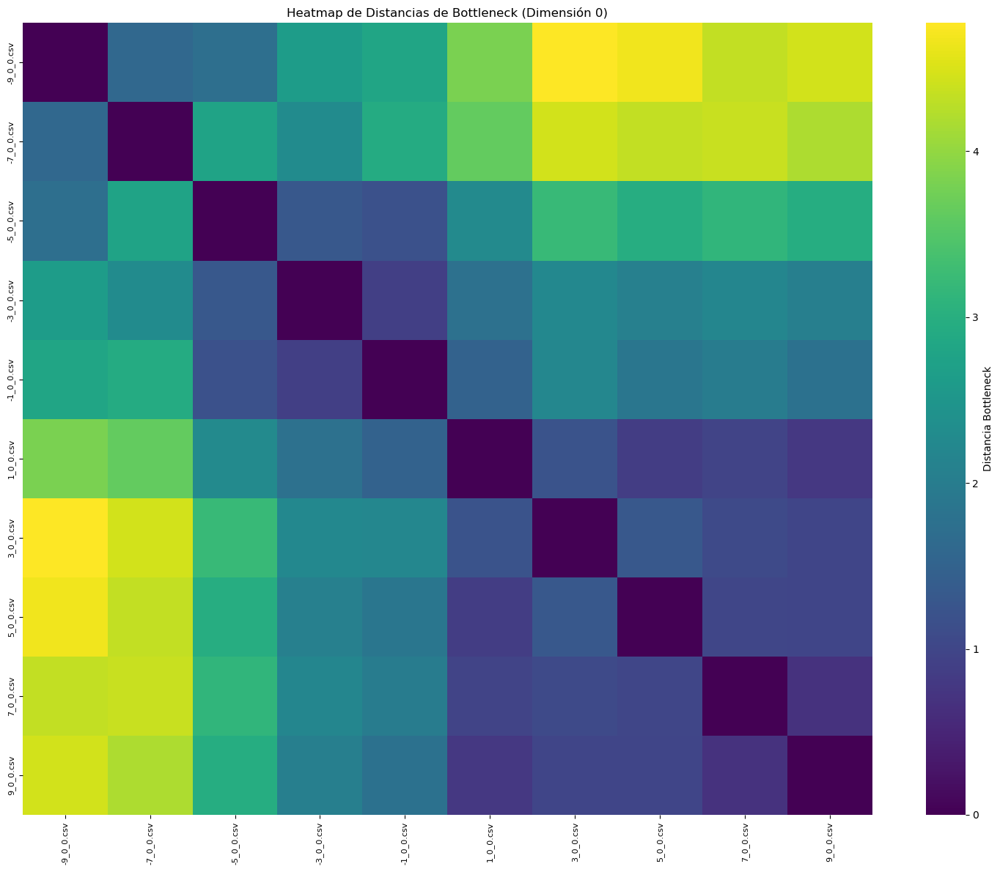

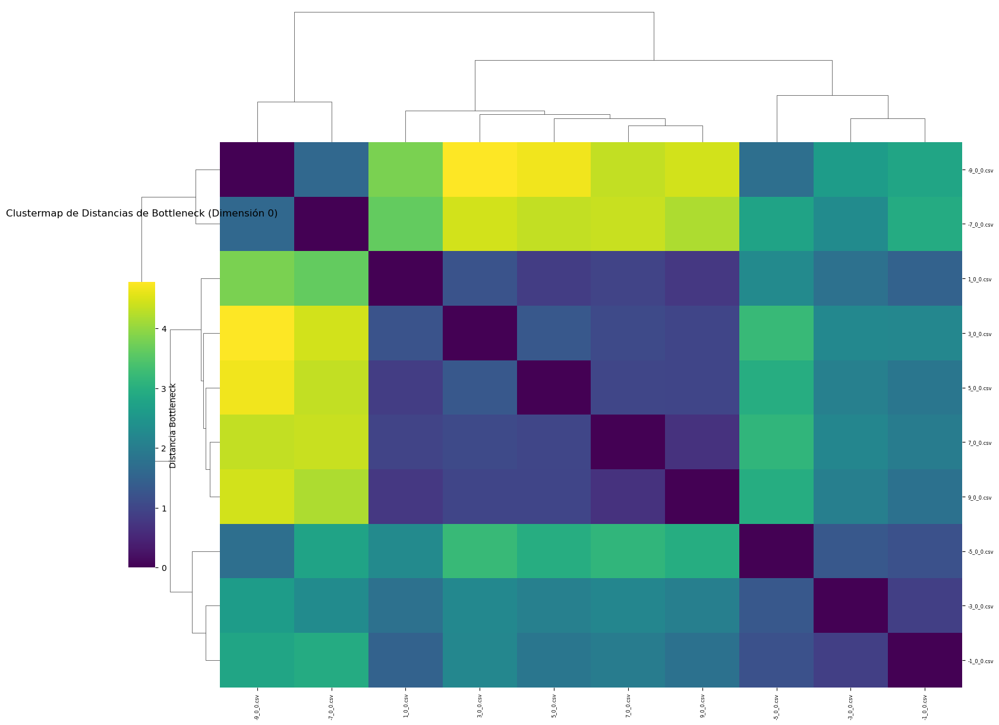

In [16]:
# Llamar a la función con tus datos
plot_heatmap_and_clustermap(distancias_dim1, archivos, "Distancias de Bottleneck (Dimensión 1)")
plot_heatmap_and_clustermap(distancias_dim0, archivos, "Distancias de Bottleneck (Dimensión 0)")

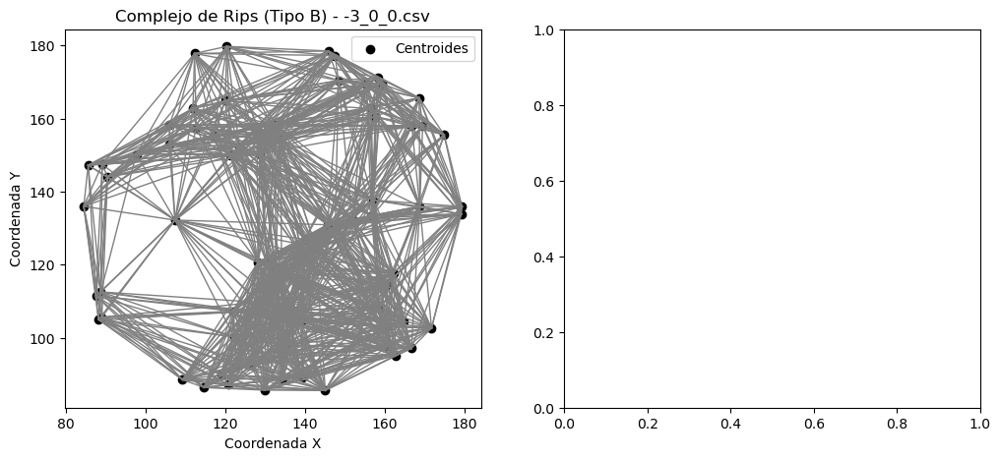

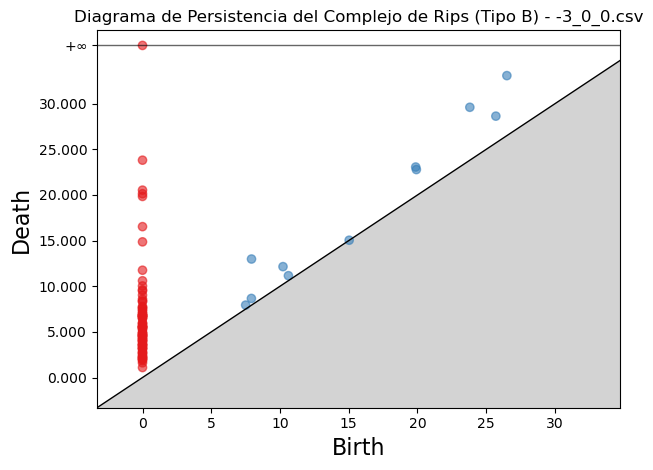

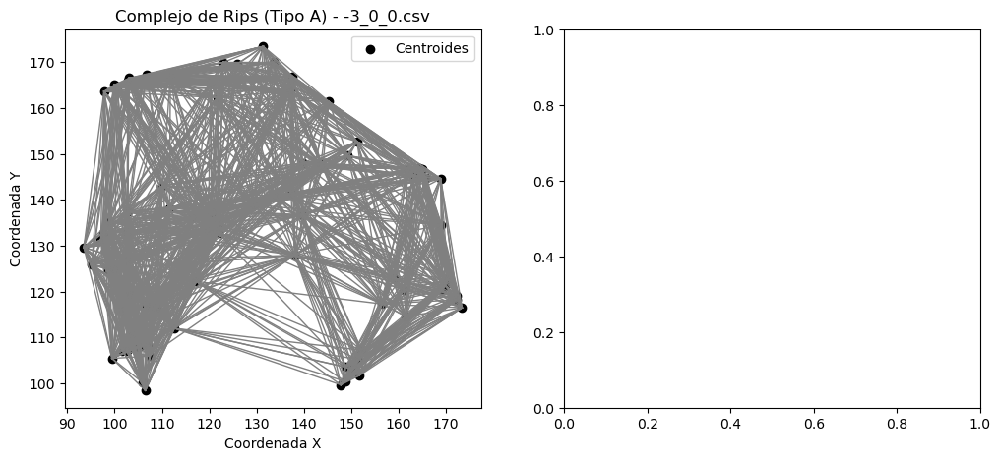

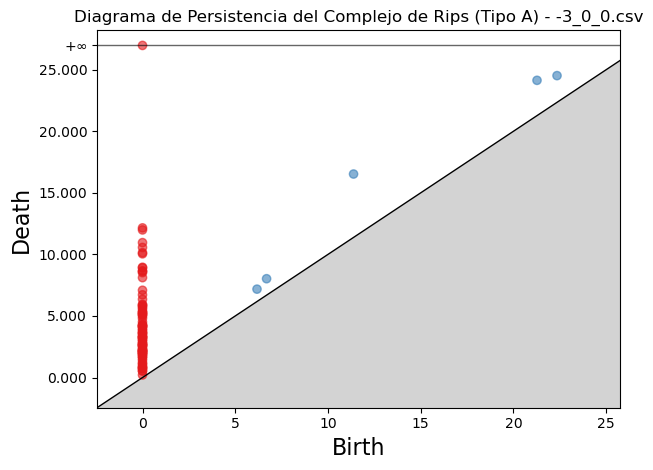

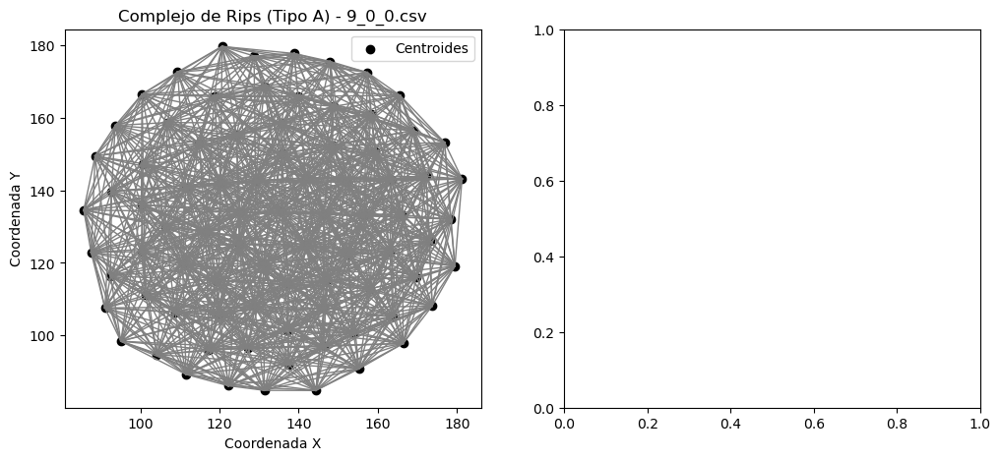

...

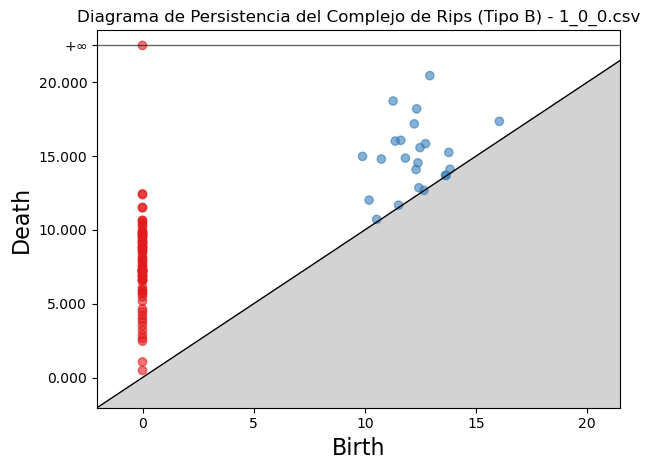

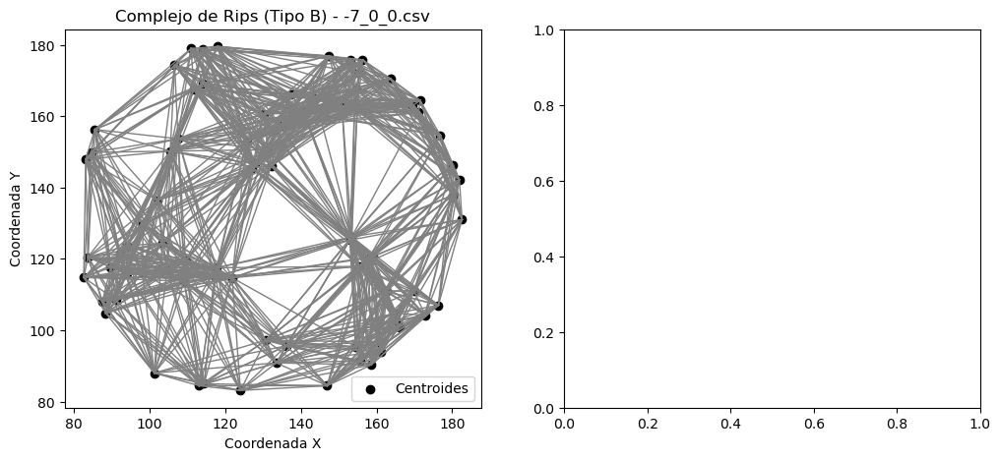

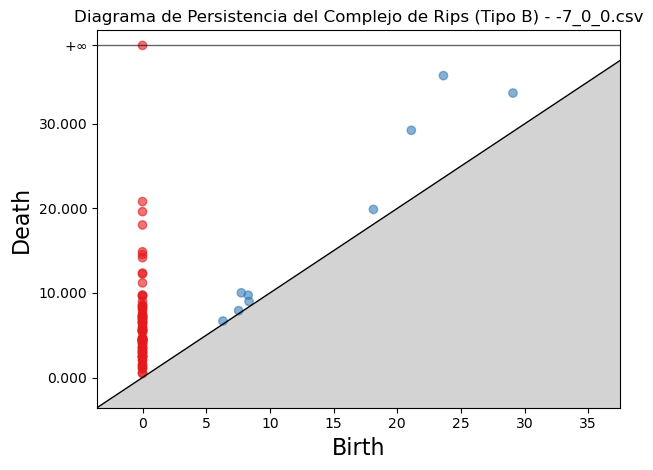

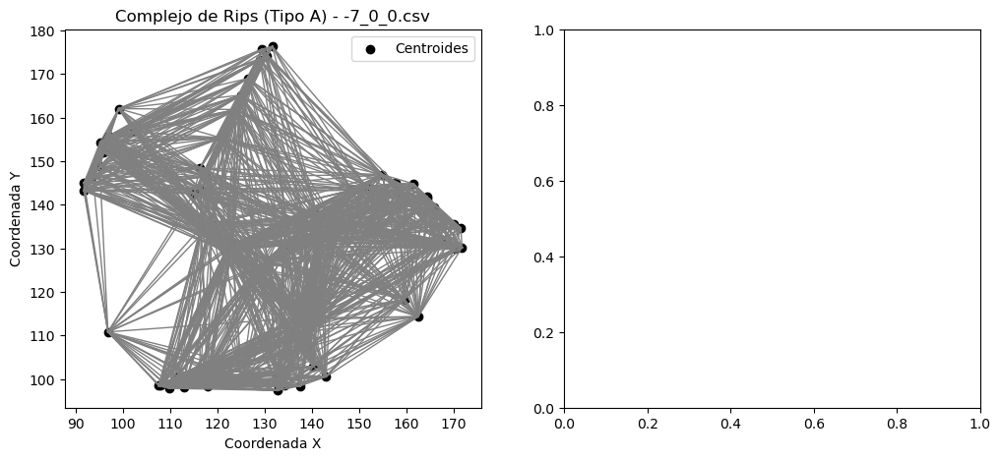

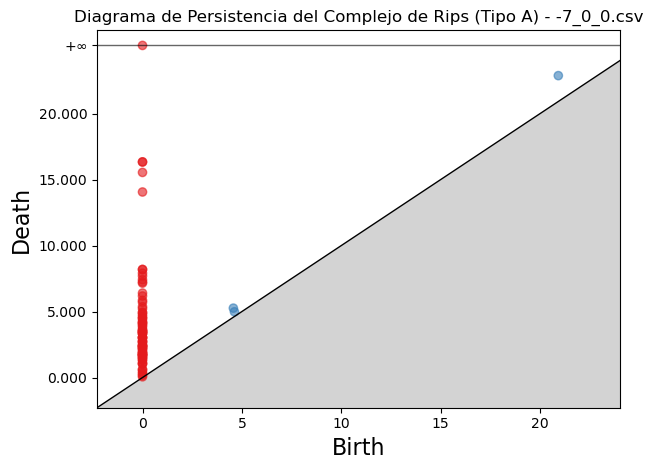

In [8]:
# Crear la carpeta para guardar los diagramas de persistencia si no existe
ruta_salida = "prueba_distancia"
if not os.path.exists(ruta_salida):
    os.makedirs(ruta_salida)

# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    # Construir la ruta completa del archivo
    ruta_completa = os.path.join(ruta_directorio, archivo_csv)
    
    # Leer el archivo CSV y asignar nombres de columnas
    df = pd.read_csv(ruta_completa, header=None)
    nombres_columnas = ['id', 'Tipo', 'X', 'Y', 'Z']  # Reemplazar con los nombres de columnas apropiados
    df.columns = nombres_columnas
    
    # Agrupar los datos por el Tipo
    tipos = df['Tipo'].unique()
    
    # Iterar por cada tipo
    for tipo in tipos:
        # Filtrar por el tipo actual
        df_tipo = df[df['Tipo'] == tipo]
        
        # Agrupar los datos por el ID
        grupos = df_tipo.groupby('id')
        
        # Inicializar listas para almacenar los centroides
        centroides_x = []
        centroides_y = []
        
        # Calcular el centroide para cada grupo
        for id_grupo, grupo in grupos:
            X_grupo = grupo['X']
            Y_grupo = grupo['Y']
            centroid_x_grupo = X_grupo.mean()
            centroid_y_grupo = Y_grupo.mean()
            centroides_x.append(centroid_x_grupo)
            centroides_y.append(centroid_y_grupo)
        
        # Convertir las coordenadas de los centroides a un formato adecuado para gudhi
        puntos = np.array(list(zip(centroides_x, centroides_y)))
        
        # Calcular el complejo de Rips con un radio específico
        rips_complex = gd.RipsComplex(points=puntos, max_edge_length=40)
        simplex_tree = rips_complex.create_simplex_tree(max_dimension=3)
        
        # Visualizar el complejo de Rips
        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.scatter(centroides_x, centroides_y, color='black', label='Centroides')
        for simplex in simplex_tree.get_skeleton(1):  # Obtener las aristas
            if len(simplex[0]) == 2:  # Asegurarse de que solo sean aristas
                arista = simplex[0]
                x = [centroides_x[i] for i in arista]
                y = [centroides_y[i] for i in arista]
                plt.plot(x, y, color='gray', linestyle='-', linewidth=1)
        plt.xlabel('Coordenada X')
        plt.ylabel('Coordenada Y')
        plt.title(f'Complejo de Rips (Tipo {tipo}) - {archivo_csv}')
        plt.legend()
        
        # Calcular el diagrama de persistencia
        diag = simplex_tree.persistence()
        
        # Mostrar el diagrama de persistencia
        plt.subplot(1, 2, 2)
        gd.plot_persistence_diagram(diag)
        plt.title(f'Diagrama de Persistencia del Complejo de Rips (Tipo {tipo}) - {archivo_csv}')
        plt.xlabel('Birth')
        plt.ylabel('Death')
        plt.tight_layout()
        plt.show()


In [9]:
import os
import numpy as np
import pandas as pd
import gudhi as gd
import gudhi.wasserstein as gw
import matplotlib.pyplot as plt

# Crear la carpeta para guardar los diagramas de persistencia si no existe
ruta_salida = "prueba_distancia"
if not os.path.exists(ruta_salida):
    os.makedirs(ruta_salida)

# Almacenar los diagramas de persistencia y los nombres de los archivos
diagramas_persistencia = {}
diagramas_persistencia_0 = {}

# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    try:
        # Construir la ruta completa del archivo
        ruta_completa = os.path.join(ruta_directorio, archivo_csv)
        
        # Leer el archivo CSV y asignar nombres de columnas
        df = pd.read_csv(ruta_completa, header=None)
        nombres_columnas = ['id', 'Tipo', 'X', 'Y', 'Z']  # Reemplazar con los nombres de columnas apropiados
        df.columns = nombres_columnas
        
        # Agrupar los datos por el ID
        grupos = df.groupby('id')
        
        # Inicializar listas para almacenar los centroides
        centroides_x = []
        centroides_y = []
        
        # Calcular el centroide para cada grupo
        for id_grupo, grupo in grupos:
            X_grupo = grupo['X']
            Y_grupo = grupo['Y']
            centroid_x_grupo = X_grupo.mean()
            centroid_y_grupo = Y_grupo.mean()
            centroides_x.append(centroid_x_grupo)
            centroides_y.append(centroid_y_grupo)
        
        # Convertir las coordenadas de los centroides a un formato adecuado para gudhi
        puntos = np.array(list(zip(centroides_x, centroides_y)))

        # Calcular el complejo de Rips con un radio específico
        rips_complex = gd.RipsComplex(points=puntos, max_edge_length=40)
        simplex_tree = rips_complex.create_simplex_tree(max_dimension=3)

        # Calcular el diagrama de persistencia
        diag = simplex_tree.persistence()

        # Almacenar los diagramas de persistencia
        diagramas_persistencia[archivo_csv] = simplex_tree.persistence_intervals_in_dimension(1)
        diagramas_persistencia_0[archivo_csv] = simplex_tree.persistence_intervals_in_dimension(0)
        
    except Exception as e:
        print(f"Error al procesar el archivo {archivo_csv}: {e}")

# Calcular las distancias de Bottleneck entre todos los pares de diagramas de persistencia
archivos = list(diagramas_persistencia.keys())
n = len(archivos)
tolerancia = 1e-10  # Tolerancia para considerar distancias efectivamente como cero

# Inicializar matrices de distancias
distancias_dim1 = np.zeros((n, n))
distancias_dim0 = np.zeros((n, n))

for i in range(n):
    for j in range(i, n):
        archivo_i = archivos[i]
        archivo_j = archivos[j]
        diag_i = diagramas_persistencia[archivo_i]
        diag_j = diagramas_persistencia[archivo_j]
        diag_i_0 = diagramas_persistencia_0[archivo_i]
        diag_j_0 = diagramas_persistencia_0[archivo_j]
        
        distancia_bottleneck = gd.bottleneck_distance(diag_i, diag_j)
        distancia_bottleneck_0 = gd.bottleneck_distance(diag_i_0, diag_j_0)
        
        distancias_dim1[i, j] = distancia_bottleneck
        distancias_dim1[j, i] = distancia_bottleneck
        distancias_dim0[i, j] = distancia_bottleneck_0
        distancias_dim0[j, i] = distancia_bottleneck_0
        
        # Verificar que la distancia de Bottleneck para el mismo archivo es efectivamente cero
        if i == j:
            if distancia_bottleneck < tolerancia:
                print(f"Distancia de Bottleneck (Dimensión 1) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Bottleneck (Dimensión 1) para {archivo_i} no es cero: {distancia_bottleneck}")
            
            if distancia_bottleneck_0 < tolerancia:
                print(f"Distancia de Bottleneck (Dimensión 0) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Bottleneck (Dimensión 0) para {archivo_i} no es cero: {distancia_bottleneck_0}")

# Calcular las distancias de Wasserstein entre todos los pares de diagramas de persistencia
distancias_wasserstein_dim1 = np.zeros((n, n))
distancias_wasserstein_dim0 = np.zeros((n, n))

for i in range(n):
    for j in range(i, n):
        archivo_i = archivos[i]
        archivo_j = archivos[j]
        diag_i = diagramas_persistencia[archivo_i]
        diag_j = diagramas_persistencia[archivo_j]
        diag_i_0 = diagramas_persistencia_0[archivo_i]
        diag_j_0 = diagramas_persistencia_0[archivo_j]
        
        # Calcular la distancia de Wasserstein
        distancia_wasserstein = gw.wasserstein_distance(diag_i, diag_j, order=1)
        distancia_wasserstein_0 = gw.wasserstein_distance(diag_i_0, diag_j_0, order=1)
        
        # Almacenar las distancias en las matrices
        distancias_wasserstein_dim1[i, j] = distancia_wasserstein
        distancias_wasserstein_dim1[j, i] = distancia_wasserstein
        distancias_wasserstein_dim0[i, j] = distancia_wasserstein_0
        distancias_wasserstein_dim0[j, i] = distancia_wasserstein_0
        
        # Verificar que las distancias de Wasserstein para el mismo archivo son efectivamente cero
        if i == j:
            if distancia_wasserstein < tolerancia:
                print(f"Distancia de Wasserstein (Dimensión 1) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Wasserstein (Dimensión 1) para {archivo_i} no es cero: {distancia_wasserstein}")
                
            if distancia_wasserstein_0 < tolerancia:
                print(f"Distancia de Wasserstein (Dimensión 0) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Wasserstein (Dimensión 0) para {archivo_i} no es cero: {distancia_wasserstein_0}")

# Guardar las matrices de distancias en archivos .npy para análisis posterior
np.save(os.path.join(ruta_salida, "distancias_bottleneck_dim1.npy"), distancias_dim1)
np.save(os.path.join(ruta_salida, "distancias_bottleneck_dim0.npy"), distancias_dim0)
np.save(os.path.join(ruta_salida, "distancias_wasserstein_dim1.npy"), distancias_wasserstein_dim1)
np.save(os.path.join(ruta_salida, "distancias_wasserstein_dim0.npy"), distancias_wasserstein_dim0)

# Opcional: Cargar las matrices guardadas en el futuro
distancias_bottleneck_dim1 = np.load(os.path.join(ruta_salida, "distancias_bottleneck_dim1.npy"))
distancias_bottleneck_dim0 = np.load(os.path.join(ruta_salida, "distancias_bottleneck_dim0.npy"))
distancias_wasserstein_dim1 = np.load(os.path.join(ruta_salida, "distancias_wasserstein_dim1.npy"))
distancias_wasserstein_dim0 = np.load(os.path.join(ruta_salida, "distancias_wasserstein_dim0.npy"))


Distancia de Bottleneck (Dimensión 1) para -3_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para -3_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para 9_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para 9_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para -1_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para -1_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para -5_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para -5_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para 3_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para 3_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para 5_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para 5_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para -9_0_0.csv es efectivamente cero.
Dista

In [15]:
import os
import numpy as np
import pandas as pd
import gudhi as gd
import gudhi.wasserstein as gw
import matplotlib.pyplot as plt
import seaborn as sns

# Crear la carpeta para guardar los diagramas de persistencia si no existe
ruta_salida = "prueba_distancia"
if not os.path.exists(ruta_salida):
    os.makedirs(ruta_salida)

# Almacenar los diagramas de persistencia y los nombres de los archivos
diagramas_persistencia = {}
diagramas_persistencia_0 = {}

# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    try:
        # Construir la ruta completa del archivo
        ruta_completa = os.path.join(ruta_directorio, archivo_csv)
        
        # Leer el archivo CSV y asignar nombres de columnas
        df = pd.read_csv(ruta_completa, header=None)
        nombres_columnas = ['id', 'Tipo', 'X', 'Y', 'Z']  # Reemplazar con los nombres de columnas apropiados
        df.columns = nombres_columnas
        
        # Agrupar los datos por el Tipo
        tipos = df['Tipo'].unique()
        
        # Agrupar los datos por el ID
        grupos = df.groupby('id')
        
        # Inicializar listas para almacenar los centroides
        centroides_x = []
        centroides_y = []
        
        # Calcular el centroide para cada grupo
        for id_grupo, grupo in grupos:
            X_grupo = grupo['X']
            Y_grupo = grupo['Y']
            centroid_x_grupo = X_grupo.mean()
            centroid_y_grupo = Y_grupo.mean()
            centroides_x.append(centroid_x_grupo)
            centroides_y.append(centroid_y_grupo)
        
        # Convertir las coordenadas de los centroides a un formato adecuado para gudhi
        puntos = np.array(list(zip(centroides_x, centroides_y)))

        # Calcular el complejo de Rips con un radio específico
        rips_complex = gd.RipsComplex(points=puntos, max_edge_length=40)
        simplex_tree = rips_complex.create_simplex_tree(max_dimension=3)

        # Calcular el diagrama de persistencia
        diag = simplex_tree.persistence()

        # Almacenar los diagramas de persistencia
        diagramas_persistencia[archivo_csv] = simplex_tree.persistence_intervals_in_dimension(1)
        diagramas_persistencia_0[archivo_csv] = simplex_tree.persistence_intervals_in_dimension(0)
        
    except Exception as e:
        print(f"Error al procesar el archivo {archivo_csv}: {e}")

# Calcular las distancias de Bottleneck entre todos los pares de diagramas de persistencia
archivos = list(diagramas_persistencia.keys())
n = len(archivos)
tolerancia = 1e-10  # Tolerancia para considerar distancias efectivamente como cero

# Inicializar matrices de distancias
distancias_dim1 = np.zeros((n, n))
distancias_dim0 = np.zeros((n, n))

for i in range(n):
    for j in range(i, n):
        archivo_i = archivos[i]
        archivo_j = archivos[j]
        diag_i = diagramas_persistencia[archivo_i]
        diag_j = diagramas_persistencia[archivo_j]
        diag_i_0 = diagramas_persistencia_0[archivo_i]
        diag_j_0 = diagramas_persistencia_0[archivo_j]
        
        distancia_bottleneck = gd.bottleneck_distance(diag_i, diag_j)
        distancia_bottleneck_0 = gd.bottleneck_distance(diag_i_0, diag_j_0)
        
        distancias_dim1[i, j] = distancia_bottleneck
        distancias_dim1[j, i] = distancia_bottleneck
        distancias_dim0[i, j] = distancia_bottleneck_0
        distancias_dim0[j, i] = distancia_bottleneck_0
        
        # Verificar que la distancia de Bottleneck para el mismo archivo es efectivamente cero
        if i == j:
            if distancia_bottleneck < tolerancia:
                print(f"Distancia de Bottleneck (Dimensión 1) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Bottleneck (Dimensión 1) para {archivo_i} no es cero: {distancia_bottleneck}")
            
            if distancia_bottleneck_0 < tolerancia:
                print(f"Distancia de Bottleneck (Dimensión 0) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Bottleneck (Dimensión 0) para {archivo_i} no es cero: {distancia_bottleneck_0}")

# Calcular las distancias de Wasserstein entre todos los pares de diagramas de persistencia
distancias_wasserstein_dim1 = np.zeros((n, n))
distancias_wasserstein_dim0 = np.zeros((n, n))

for i in range(n):
    for j in range(i, n):
        archivo_i = archivos[i]
        archivo_j = archivos[j]
        diag_i = diagramas_persistencia[archivo_i]
        diag_j = diagramas_persistencia[archivo_j]
        diag_i_0 = diagramas_persistencia_0[archivo_i]
        diag_j_0 = diagramas_persistencia_0[archivo_j]
        
        # Calcular la distancia de Wasserstein
        distancia_wasserstein = gw.wasserstein_distance(diag_i, diag_j, order=1)
        distancia_wasserstein_0 = gw.wasserstein_distance(diag_i_0, diag_j_0, order=1)
        
        # Almacenar las distancias en las matrices
        distancias_wasserstein_dim1[i, j] = distancia_wasserstein
        distancias_wasserstein_dim1[j, i] = distancia_wasserstein
        distancias_wasserstein_dim0[i, j] = distancia_wasserstein_0
        distancias_wasserstein_dim0[j, i] = distancia_wasserstein_0
        
        # Verificar que las distancias de Wasserstein para el mismo archivo son efectivamente cero
        if i == j:
            if distancia_wasserstein < tolerancia:
                print(f"Distancia de Wasserstein (Dimensión 1) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Wasserstein (Dimensión 1) para {archivo_i} no es cero: {distancia_wasserstein}")
                
            if distancia_wasserstein_0 < tolerancia:
                print(f"Distancia de Wasserstein (Dimensión 0) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Wasserstein (Dimensión 0) para {archivo_i} no es cero: {distancia_wasserstein_0}")

# Guardar las matrices de distancias en archivos .npy para análisis posterior
np.save(os.path.join(ruta_salida, "distancias_bottleneck_dim1.npy"), distancias_dim1)
np.save(os.path.join(ruta_salida, "distancias_bottleneck_dim0.npy"), distancias_dim0)
np.save(os.path.join(ruta_salida, "distancias_wasserstein_dim1.npy"), distancias_wasserstein_dim1)
np.save(os.path.join(ruta_salida, "distancias_wasserstein_dim0.npy"), distancias_wasserstein_dim0)

# Opcional: Cargar las matrices guardadas en el futuro
distancias_bottleneck_dim1 = np.load(os.path.join(ruta_salida, "distancias_bottleneck_dim1.npy"))
distancias_bottleneck_dim0 = np.load(os.path.join(ruta_salida, "distancias_bottleneck_dim0.npy"))
distancias_wasserstein_dim1 = np.load(os.path.join(ruta_salida, "distancias_wasserstein_dim1.npy"))
distancias_wasserstein_dim0 = np.load(os.path.join(ruta_salida, "distancias_wasserstein_dim0.npy"))

# Función para separar los niveles de adhesividad y devolver una lista con los tres valores
def extract_levels(filename):
    # Elimina la extensión si la hay y separa por "_"
    parts = filename.replace('.csv', '').split('_')
    return parts  # Devolvemos todo, ya que queremos usarlo para incluir el tipo

# Función para ordenar los nombres de archivos
def sort_filenames(filenames):
    # Extrae los niveles y ordena
    sorted_filenames = sorted(filenames, key=extract_levels)
    return sorted_filenames

# Función para reordenar la matriz de acuerdo con los nombres ordenados
def reorder_matrix(matrix, filenames):
    # Obtén los índices de los nombres ordenados
    sorted_filenames = sort_filenames(filenames)
    indices = [filenames.index(name) for name in sorted_filenames]
    # Reordena la matriz
    reordered_matrix = matrix[np.ix_(indices, indices)]
    return reordered_matrix, sorted_filenames

# Visualizar las matrices de distancias como heatmaps y clustermaps
def plot_heatmap_and_clustermap_with_type(matrix, filenames, title):
    # Ordena la matriz y los nombres de archivos
    reordered_matrix, sorted_filenames = reorder_matrix(matrix, archivos_con_tipo)
    
    # Crear figura
    plt.figure(figsize=(10, 8))
    
    # Heatmap
    sns.heatmap(reordered_matrix, annot=True, fmt=".2f", cmap='coolwarm', xticklabels=sorted_filenames, yticklabels=sorted_filenames)
    plt.title(title)
    plt.xlabel('Archivos')
    plt.ylabel('Archivos')
    
    # Guardar heatmap
    plt.savefig(os.path.join(ruta_salida, f"{title.replace(' ', '_').lower()}.png"))
    plt.close()
    
    # Clustermap
    sns.clustermap(reordered_matrix, annot=True, fmt=".2f", cmap='coolwarm', xticklabels=sorted_filenames, yticklabels=sorted_filenames)
    plt.title(title)
    
    # Guardar clustermap
    plt.savefig(os.path.join(ruta_salida, f"clustermap_{title.replace(' ', '_').lower()}.png"))
    plt.close()

# Lista de archivos (filenames) correspondientes a los diagramas de persistencia
archivos_con_tipo = [f"{archivo_csv}_Tipo{tipo}" for archivo_csv, tipo in zip(archivos_csv, tipos)]

# Visualizar distancias de Bottleneck para dimensión 1 y 0 (con tipo)
plot_heatmap_and_clustermap_with_type(distancias_bottleneck_dim1, archivos_con_tipo, "Distancia Bottleneck (Dimensión 1)")
plot_heatmap_and_clustermap_with_type(distancias_bottleneck_dim0, archivos_con_tipo, "Distancia Bottleneck (Dimensión 0)")

# Visualizar distancias de Wasserstein para dimensión 1 y 0 (con tipo)
plot_heatmap_and_clustermap_with_type(distancias_wasserstein_dim1, archivos_con_tipo, "Distancia Wasserstein (Dimensión 1)")
plot_heatmap_and_clustermap_with_type(distancias_wasserstein_dim0, archivos_con_tipo, "Distancia Wasserstein (Dimensión 0)")


Distancia de Bottleneck (Dimensión 1) para -3_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para -3_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para 9_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para 9_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para -1_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para -1_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para -5_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para -5_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para 3_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para 3_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para 5_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para 5_0_0.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para -9_0_0.csv es efectivamente cero.
Dista